In [1]:
import pandas as pd
import numpy as np
import math
import geopandas as gpd
import matplotlib.pyplot as plt
from scipy.integrate import quad
from scipy.optimize import minimize
from IPython.display import display, Math, Latex
from shapely.geometry import shape
from shapely.wkt import loads
import contextily as cx
import mapclassify
from matplotlib.colors import ListedColormap
import seaborn as sns

from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Rectangle
from matplotlib.colors import LinearSegmentedColormap


In [307]:
save_figures = True
folder = 'plots'
publication = True
if publication == True:
    folder = 'plots for publication'

In [3]:
# data_hh_no_insurance = pd.read_csv('results/data_hh_no_insurance.csv')
# data_hh_base_insurance = pd.read_csv('results/data_hh_base_insurance.csv')
# data_hh = pd.read_csv('results/data_hh.csv')

In [4]:
data_quantiles_no_insurance = pd.read_csv('results/data_quantiles_no_insurance.csv')
data_quantiles_no_insurance.set_index(data_quantiles_no_insurance.columns[0], inplace=True)
data_bg_no_insurance = pd.read_csv('results/bg_no_insurance.csv')
data_bg_no_insurance['geometry'] = data_bg_no_insurance['geometry'].apply(loads)
bg_no_insurance = gpd.GeoDataFrame(data_bg_no_insurance, geometry="geometry", crs='EPSG:4326')

data_quantiles_base_insurance = pd.read_csv('results/data_quantiles_uptake55_insurance.csv')
data_quantiles_base_insurance.set_index(data_quantiles_base_insurance.columns[0], inplace=True)
data_bg_base_insurance = pd.read_csv('results/bg_uptake55_insurance.csv')
data_bg_base_insurance['geometry'] = data_bg_base_insurance['geometry'].apply(loads)
bg_base_insurance = gpd.GeoDataFrame(data_bg_base_insurance, geometry="geometry", crs='EPSG:4326')

data_quantiles_uptake65_insurance = pd.read_csv('results/data_quantiles_uptake65_insurance.csv')
data_quantiles_uptake65_insurance.set_index(data_quantiles_uptake65_insurance.columns[0], inplace=True)
data_bg_uptake65_insurance = pd.read_csv('results/bg_uptake65_insurance.csv')
data_bg_uptake65_insurance['geometry'] = data_bg_uptake65_insurance['geometry'].apply(loads)
bg_uptake65_insurance = gpd.GeoDataFrame(data_bg_uptake65_insurance, geometry="geometry", crs='EPSG:4326')

# data_quantiles_uptake80_insurance = pd.read_csv('results/data_quantiles_uptake80_insurance.csv')
# data_quantiles_uptake80_insurance.set_index(data_quantiles_uptake80_insurance.columns[0], inplace=True)
# data_bg_uptake80_insurance = pd.read_csv('results/bg_uptake80_insurance.csv')
# data_bg_uptake80_insurance['geometry'] = data_bg_uptake80_insurance['geometry'].apply(loads)
# bg_uptake80_insurance = gpd.GeoDataFrame(data_bg_uptake80_insurance, geometry="geometry", crs='EPSG:4326')

data_bg_lab_not_opt = pd.read_csv('results/bg_no_insurance_labda_not_opt.csv')
data_quantiles_lab_not_opt = pd.read_csv('results/data_quantiles_no_insurance_labda_not_opt.csv')
data_quantiles_lab_not_opt.set_index(data_quantiles_lab_not_opt.columns[0], inplace=True)
data_bg_lab_not_opt['geometry'] = data_bg_lab_not_opt['geometry'].apply(loads)
bg_lab_not_opt = gpd.GeoDataFrame(data_bg_lab_not_opt, geometry="geometry", crs='EPSG:4326')

In [5]:
diff_v = '_const_v'
data_quantiles_const_v = pd.read_csv(f'results/data_quantiles_no_insurance{diff_v}.csv')
data_quantiles_const_v.set_index(data_quantiles_const_v.columns[0], inplace=True)

data_bg_const_v = pd.read_csv(f'results/bg_no_insurance{diff_v}.csv')
data_bg_const_v['geometry'] = data_bg_const_v['geometry'].apply(loads)
bg_const_v = gpd.GeoDataFrame(data_bg_const_v, geometry="geometry", crs='EPSG:4326')

In [6]:
variant = '_eta=2'
data_bg_eta_2 = pd.read_csv(f'results/bg_no_insurance{variant}.csv')
data_quantiles_eta_2 = pd.read_csv(f'results/data_quantiles_no_insurance{variant}.csv')
data_quantiles_eta_2.set_index(data_quantiles_eta_2.columns[0], inplace=True)
data_bg_eta_2['geometry'] = data_bg_eta_2['geometry'].apply(loads)
bg_eta_2 = gpd.GeoDataFrame(data_bg_eta_2, geometry="geometry", crs='EPSG:4326')

In [7]:
oth_damage = '_25_damage'
data_bg_25 = pd.read_csv(f'results/bg_no_insurance{oth_damage}.csv')
data_quantiles_25 = pd.read_csv(f'results/data_quantiles_no_insurance{oth_damage}.csv')
data_quantiles_25.set_index(data_quantiles_25.columns[0], inplace=True)
data_bg_25['geometry'] = data_bg_25['geometry'].apply(loads)
bg_25 = gpd.GeoDataFrame(data_bg_25, geometry="geometry", crs='EPSG:4326')

In [8]:
oth_damage_2 = '_og_damage'
data_bg_og = pd.read_csv(f'results/bg_no_insurance{oth_damage_2}.csv')
data_quantiles_og = pd.read_csv(f'results/data_quantiles_no_insurance{oth_damage_2}.csv')
data_quantiles_og.set_index(data_quantiles_og.columns[0], inplace=True)
data_bg_og['geometry'] = data_bg_og['geometry'].apply(loads)
bg_og = gpd.GeoDataFrame(data_bg_og, geometry="geometry", crs='EPSG:4326')

In [9]:
discount = '_discount1%'
data_quantiles_disc1 = pd.read_csv(f'results/data_quantiles_no_insurance{discount}.csv')
data_quantiles_disc1.set_index(data_quantiles_disc1.columns[0], inplace=True)

data_bg_disc1 = pd.read_csv(f'results/bg_no_insurance{discount}.csv')
data_bg_disc1['geometry'] = data_bg_disc1['geometry'].apply(loads)
bg_disc1 = gpd.GeoDataFrame(data_bg_disc1, geometry="geometry", crs='EPSG:4326')

In [10]:
bg_no_insurance.loc[31, 'recovery_time'] = 10
bg_no_insurance.loc[32, 'recovery_time'] = 10
# bg_base_insurance.loc[31, 'recovery_time'] = 10
# bg_base_insurance.loc[32, 'recovery_time'] = 10

In [11]:
# data_bg_lab_not_opt.info()

In [12]:
bg_no_insurance['v_percentage'] = bg_no_insurance['v']*100
bg_no_insurance['diff_welfare_loss'] = bg_no_insurance['welfare_loss']-bg_base_insurance['welfare_loss']

In [13]:
# Create an empty DataFrame to calculate percentage changes
columns = ['change_insurance_welfare', 'change_insurance_recovery_t']
percen = pd.DataFrame(columns=columns)

In [14]:
percen['change_insurance_welfare'] = (data_quantiles_base_insurance['welfare_loss'] - data_quantiles_no_insurance['welfare_loss']) / -data_quantiles_no_insurance['welfare_loss']*100
percen['change_insurance_recovery_t'] = (data_quantiles_base_insurance['recovery_time'] - data_quantiles_no_insurance['recovery_time']) / -data_quantiles_no_insurance['recovery_time']*100

In [15]:
(bg_base_insurance['welfare_loss'].sum()-bg_no_insurance['welfare_loss'].sum())/bg_no_insurance['welfare_loss'].sum()*100

-27.029339016661613

In [16]:
percen

,change_insurance_welfare,change_insurance_recovery_t
Unnamed: 0,,
low_incomes,26.067939,37.082635
mid_low_incomes,27.931281,38.389560
mid_high_incomes,27.992459,39.279164
high_incomes,28.673670,39.462143


In [17]:
bg_no_insurance['resilience']= bg_no_insurance['ave_damage']/bg_no_insurance['welfare_loss']*100
bg_no_insurance['log_resilience'] = np.log10(bg_no_insurance['resilience'])
bg_no_insurance['log0_resilience'] = np.log(bg_no_insurance['resilience'])
bg_no_insurance['log2_resilience'] = np.log2(bg_no_insurance['resilience'])

In [18]:
# Create an empty DataFrame to calculate percentage changes
columns = ['total_premium_payed', 'total_claim']
premium_df = pd.DataFrame(columns=columns)
premium_df_control = pd.DataFrame(columns=columns)

In [19]:
premium_df['total_premium_payed'] = data_quantiles_no_insurance['premium']*10
premium_df['total_claim'] = data_quantiles_no_insurance['damage']*0.45

In [20]:
premium_df_control['total_premium_payed'] = data_quantiles_const_v['premium']*10
premium_df_control['total_claim'] = data_quantiles_const_v['damage']*0.45

In [21]:
premium_df_control

,total_premium_payed,total_claim
Unnamed: 0,,
low_incomes,10930.962720,4908.368568
mid_low_incomes,5012.910410,5897.473224
mid_high_incomes,18309.092052,7660.978368
high_incomes,14066.746402,10601.582718


In [22]:
def round_legend(df, col, k, round_too):
    # get all upper bounds
    upper_bounds = mapclassify.Quantiles(df[col], k=k).bins
    # insert minimal value in front to get all bounds
    bounds = np.insert(upper_bounds, 0, df[col].min())
    rounded_bounds = np.round(bounds / round_too) * round_too
    # format the numerical legend here
    intervals = [f'{rounded_bounds[i]:.0f}-{rounded_bounds[i+1]:.0f}' for i in range(len(bounds)-1)]

    # get all the legend labels
    legend_labels = ax.get_legend().get_texts()
    # replace the legend labels
    return intervals, legend_labels

#### map average damage & v loss ratio

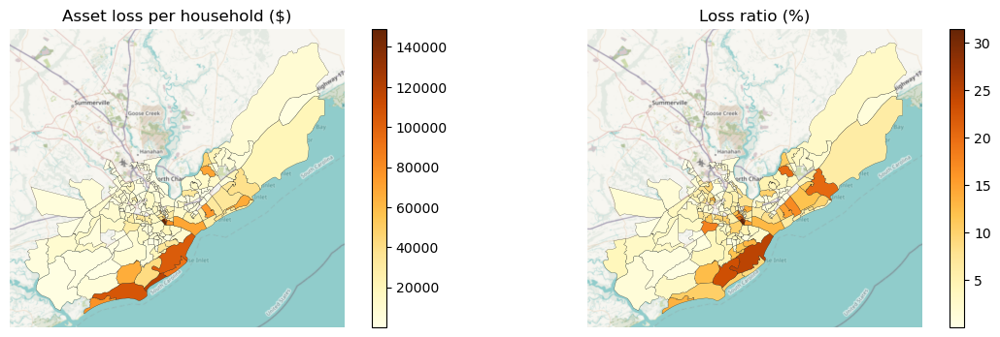

In [24]:
from matplotlib.patches import Patch

f, ax = plt.subplots(1, 2, figsize=(15, 4))
f.subplots_adjust(wspace=0.05)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0], column='ave_damage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)
bg_no_insurance.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

bg_no_insurance.plot(ax=ax[1], column='v_percentage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)
bg_no_insurance.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0].set_title('Asset loss per household ($)')
ax[1].set_title('Loss ratio (%)')

cx.add_basemap(ax=ax[0], crs='EPSG:4326', attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, extreme event, asset loss and loss ratio.jpg', dpi=1000, bbox_inches='tight')

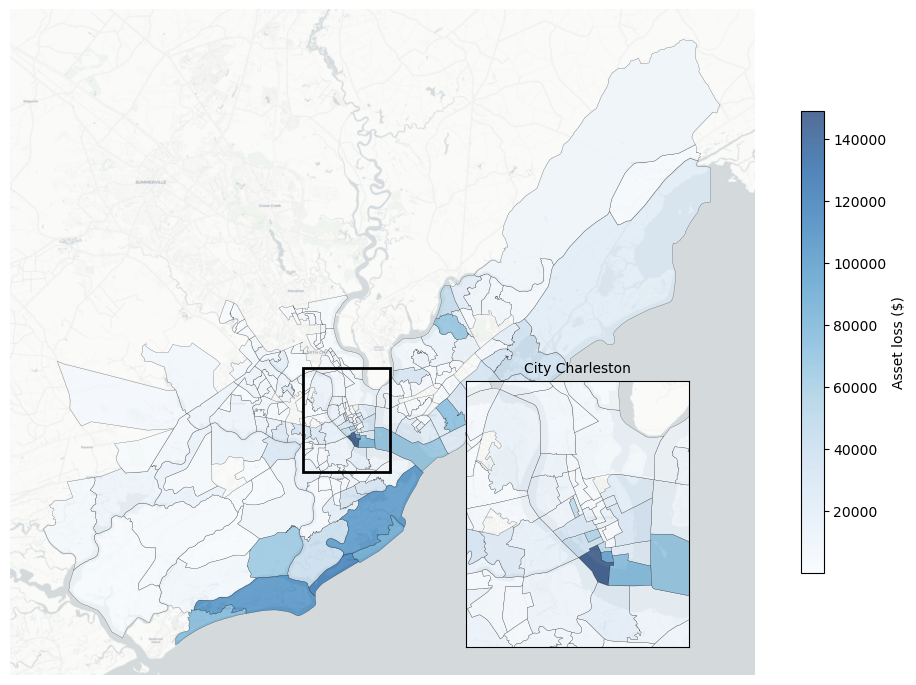

In [25]:
alphalevel=0.7

fig, ax = plt.subplots(figsize=(12, 12))
bg_no_insurance.plot(ax=ax, column='ave_damage', legend=True,legend_kwds={"shrink":.5,'alpha':alphalevel,"label":"Asset loss ($)"}, cmap="Blues", linewidth=0.2, edgecolor='black', alpha=alphalevel)
ax.set_aspect(1.2)

# Define the zoomed-in area bounds
zoom_x_min, zoom_x_max = -80.0, -79.9  # Longitude bounds
zoom_y_min, zoom_y_max = 32.74, 32.84  # Latitude bounds

# Add a rectangle to indicate the zoomed-in area on the main map
rect = Rectangle((zoom_x_min, zoom_y_min),  # Bottom-left corner
                 zoom_x_max - zoom_x_min,  # Width
                 zoom_y_max - zoom_y_min,  # Height
                 linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Add a magnified inset
inset_ax = inset_axes(ax, width="40%", height="40%", loc="lower right", borderpad=2)
bg_no_insurance.plot(ax=inset_ax, column='ave_damage', cmap="Blues", linewidth=0.2, edgecolor='black', alpha=alphalevel)

cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=14, attribution=False)
cx.add_basemap(ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)

# cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False) # low quality
# cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, attribution=False) # low quality

# Set the zoomed-in area in the inset
inset_ax.set_xlim([zoom_x_min, zoom_x_max])
inset_ax.set_ylim([zoom_y_min, zoom_y_max])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title('City Charleston', fontsize=10)
ax.axis('off')

fig.savefig(f'{folder}/maps, extreme, asset loss, zoomed in.jpg', dpi=600, bbox_inches='tight')

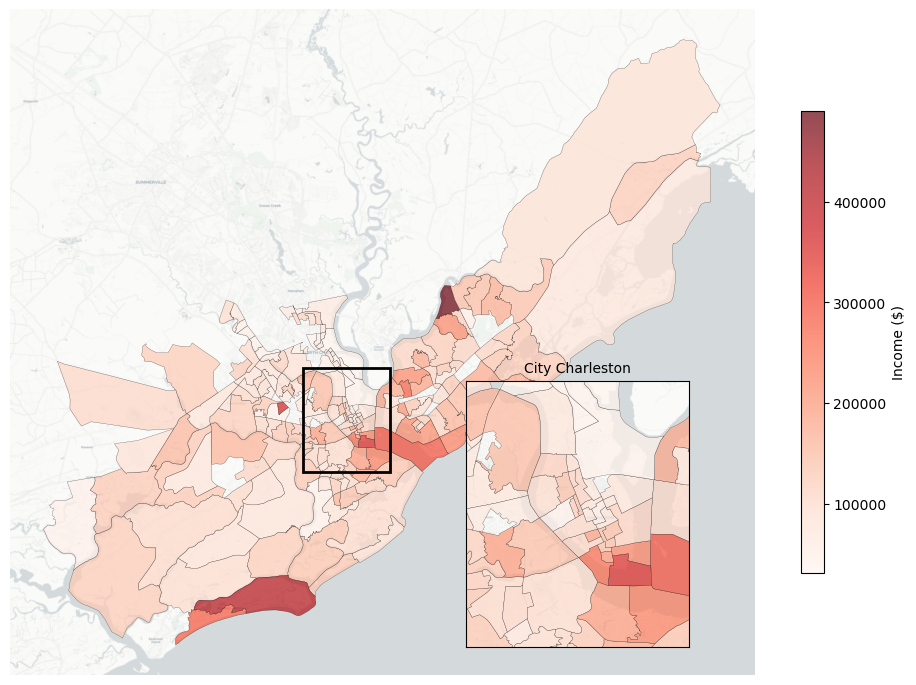

In [26]:
alphalevel=0.7

fig, ax = plt.subplots(figsize=(12, 12))
bg_no_insurance.plot(ax=ax, column='ave_i_0', legend=True,legend_kwds={"shrink":.5,'alpha':alphalevel,"label":"Income ($)"}, cmap="Reds", linewidth=0.2, edgecolor='black', alpha=alphalevel)
ax.set_aspect(1.2)

# Define the zoomed-in area bounds
zoom_x_min, zoom_x_max = -80.0, -79.9  # Longitude bounds
zoom_y_min, zoom_y_max = 32.74, 32.84  # Latitude bounds

# Add a rectangle to indicate the zoomed-in area on the main map
rect = Rectangle((zoom_x_min, zoom_y_min),  # Bottom-left corner
                 zoom_x_max - zoom_x_min,  # Width
                 zoom_y_max - zoom_y_min,  # Height
                 linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Add a magnified inset
inset_ax = inset_axes(ax, width="40%", height="40%", loc="lower right", borderpad=2)
bg_no_insurance.plot(ax=inset_ax, column='ave_i_0', cmap="Reds", linewidth=0.2, edgecolor='black', alpha=alphalevel)

cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=14, attribution=False)
cx.add_basemap(ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)

# cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False) # low quality
# cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, attribution=False) # low quality

# Set the zoomed-in area in the inset
inset_ax.set_xlim([zoom_x_min, zoom_x_max])
inset_ax.set_ylim([zoom_y_min, zoom_y_max])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title('City Charleston', fontsize=10)
ax.axis('off')

fig.savefig(f'{folder}/maps, income, zoomed in.jpg', dpi=600, bbox_inches='tight')

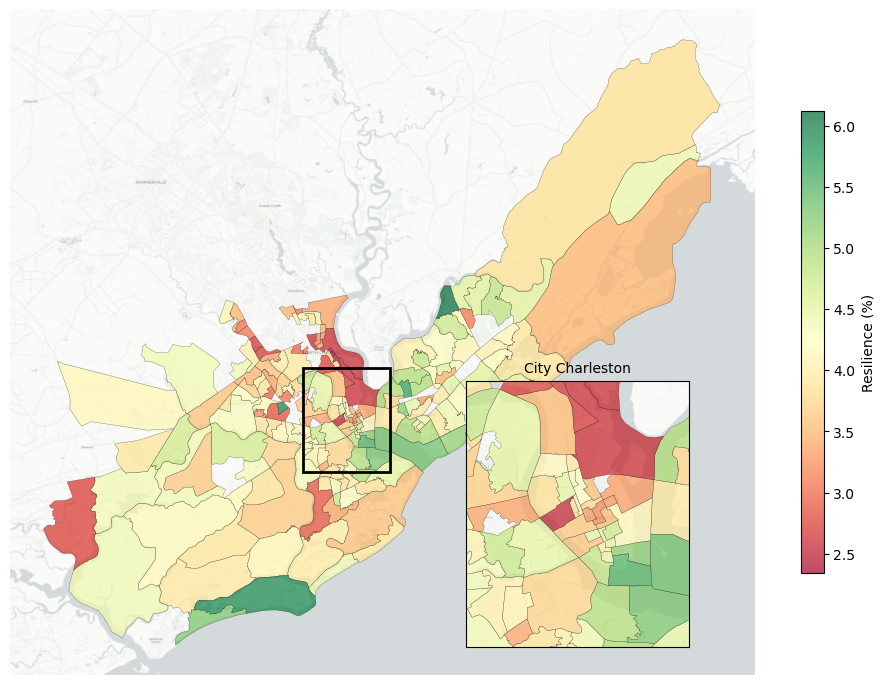

In [27]:
alphalevel=0.7
column = 'log0_resilience'

fig, ax = plt.subplots(figsize=(12, 12))
bg_no_insurance.plot(ax=ax, column=column, legend=True,legend_kwds={"shrink":.5,'alpha':alphalevel,"label":"Resilience (%)"}, cmap="RdYlGn", linewidth=0.2, edgecolor='black', alpha=alphalevel)
ax.set_aspect(1.2)

# Define the zoomed-in area bounds
zoom_x_min, zoom_x_max = -80.0, -79.9  # Longitude bounds
zoom_y_min, zoom_y_max = 32.74, 32.84  # Latitude bounds

# Add a rectangle to indicate the zoomed-in area on the main map
rect = Rectangle((zoom_x_min, zoom_y_min),  # Bottom-left corner
                 zoom_x_max - zoom_x_min,  # Width
                 zoom_y_max - zoom_y_min,  # Height
                 linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Add a magnified inset
inset_ax = inset_axes(ax, width="40%", height="40%", loc="lower right", borderpad=2)
bg_no_insurance.plot(ax=inset_ax, column=column, cmap="RdYlGn", linewidth=0.2, edgecolor='black', alpha=alphalevel)

cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=14, attribution=False)
cx.add_basemap(ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)

# cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False) # low quality
# cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, attribution=False) # low quality

# Set the zoomed-in area in the inset
inset_ax.set_xlim([zoom_x_min, zoom_x_max])
inset_ax.set_ylim([zoom_y_min, zoom_y_max])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title('City Charleston', fontsize=10)
ax.axis('off')

fig.savefig(f'{folder}/maps, {column}, zoomed in.jpg', dpi=600, bbox_inches='tight')

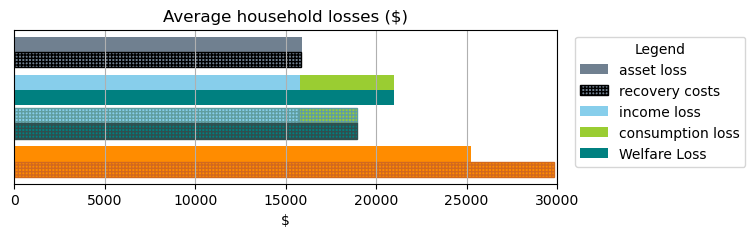

In [28]:
sum_data = pd.DataFrame(bg_no_insurance[['ave_damage', 'welfare_loss','recovery_costs', 'income_loss', 'consump_loss']].mean()).T
sum_data_v = pd.DataFrame(bg_const_v[['ave_damage', 'welfare_loss','recovery_costs', 'income_loss', 'consump_loss']].mean()).T

# Define the colors
colors = ['slategray', 'teal', 'darkorange']
color = ['skyblue', 'yellowgreen']
custom_cmap = ListedColormap(color)
bar_width = 0.1

ax = sum_data['ave_damage'].plot(kind='barh', figsize=[7, 2],stacked=False, position=0.5, color=colors[0], width=bar_width)#, legend=True)
sum_data_v['ave_damage'].plot(hatch='+++++',edgecolor='black',kind="barh", ax=ax, stacked=False, position=1.5, color=colors[0], width=bar_width)#, legend=True)

sum_data[['recovery_costs', 'income_loss']].plot(kind="barh", ax=ax, stacked=True, position=3, cmap=custom_cmap, width=bar_width)#, legend=True)
sum_data['consump_loss'].plot(kind="barh", ax=ax, stacked=False, position=4, color=colors[1], width=bar_width)#, legend=True)

sum_data_v[['recovery_costs', 'income_loss']].plot(hatch='+++++',edgecolor='cadetblue',kind="barh", ax=ax, stacked=True, position=5.2, cmap=custom_cmap, width=bar_width)#, legend=True)
sum_data_v['consump_loss'].plot(hatch='+++++',edgecolor='darkslategrey',kind="barh", ax=ax, stacked=False, position=6.2, color=colors[1], width=bar_width)#, legend=True)

sum_data['welfare_loss'].plot(kind="barh", ax=ax, stacked=False, position=7.7, color=colors[2], width=bar_width)#, legend=True)
sum_data_v['welfare_loss'].plot(hatch='+++++',edgecolor='chocolate', kind="barh", ax=ax, stacked=False, position=8.7, color=colors[2], width=bar_width)#, legend=True)

ax.set_xlabel('$')
ax.set_title('Average household losses ($)')
plt.axis('tight')
ax.grid(True)
ax.set_xlim(0, 30000)
ax.set_yticks([])
ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), title='Legend', labels=['asset loss','recovery costs','income loss', 'consumption loss','Welfare Loss'])

# # Save the plot if required
# if save_figures:
#     plt.savefig(f'{folder}/bar plot of average household losses.jpg', dpi=500, bbox_inches='tight')

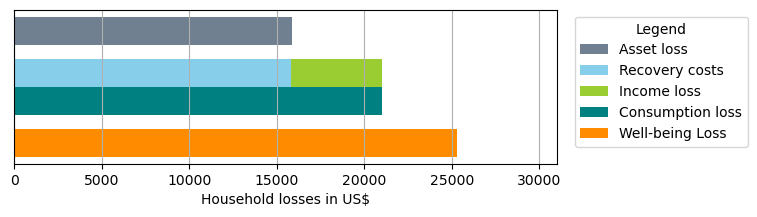

In [29]:
sum_data = pd.DataFrame(bg_no_insurance[['ave_damage', 'welfare_loss','recovery_costs', 'income_loss', 'consump_loss']].mean()).T
# Define the colors
colors = ['slategray', 'teal', 'darkorange']
color = ['skyblue', 'yellowgreen']
custom_cmap = ListedColormap(color)
bar_width = 0.1

# Plot the summed data
ax = sum_data['ave_damage'].plot(kind='barh', figsize=[7, 2],stacked=False, position=0.5, color=colors[0], width=bar_width)#, legend=True)
sum_data[['recovery_costs', 'income_loss']].plot(kind="barh", ax=ax, stacked=True, position=2, cmap=custom_cmap, width=bar_width)#, legend=True)
sum_data['consump_loss'].plot(kind="barh", ax=ax, stacked=False, position=3, color=colors[1], width=bar_width)#, legend=True)
sum_data['welfare_loss'].plot(kind="barh", ax=ax, stacked=False, position=4.5, color=colors[2], width=bar_width)#, legend=True)

ax.set_xlabel('Household losses in US$')
# ax.set_title('Average household losses, extreme event')
plt.axis('tight')
ax.grid(True)
ax.set_xlim(0, 31000)
ax.set_yticks([])

# Place the legend outside of the plot
ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), title='Legend', labels=['Asset loss','Recovery costs','Income loss', 'Consumption loss','Well-being Loss'])

if save_figures == True:
    plt.savefig(f'{folder}/bar plot, extreme event, of average household losses.jpg', dpi=500, bbox_inches='tight')

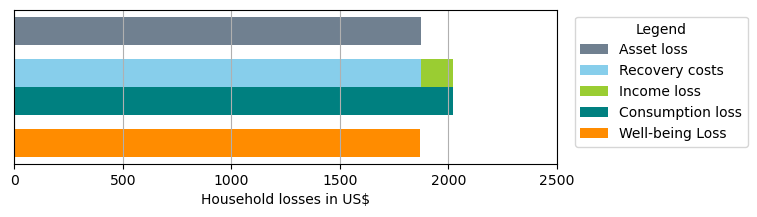

In [30]:
sum_data = pd.DataFrame(bg_og[['ave_damage', 'welfare_loss','recovery_costs', 'income_loss', 'consump_loss']].mean()).T

colors = ['slategray', 'teal', 'darkorange']
color = ['skyblue', 'yellowgreen']
custom_cmap = ListedColormap(color)
bar_width = 0.1

ax = sum_data['ave_damage'].plot(kind='barh', figsize=[7, 2],stacked=False, position=0.5, color=colors[0], width=bar_width)#, legend=True)
sum_data[['recovery_costs', 'income_loss']].plot(kind="barh", ax=ax, stacked=True, position=2, cmap=custom_cmap, width=bar_width)#, legend=True)
sum_data['consump_loss'].plot(kind="barh", ax=ax, stacked=False, position=3, color=colors[1], width=bar_width)#, legend=True)
sum_data['welfare_loss'].plot(kind="barh", ax=ax, stacked=False, position=4.5, color=colors[2], width=bar_width)#, legend=True)

ax.set_xlabel('Household losses in US$')
# ax.set_title('Average household losses, actual event')
plt.axis('tight')
ax.grid(True)
ax.set_xlim(0, 2500)
ax.set_yticks([])

ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), title='Legend', labels=['Asset loss','Recovery costs','Income loss', 'Consumption loss','Well-being Loss'])

if save_figures == True:
    plt.savefig(f'{folder}/bar plot, actual event, of average household losses.jpg', dpi=500, bbox_inches='tight')

In [31]:
sum_data['ave_damage']

0    1874.682947
Name: ave_damage, dtype: float64

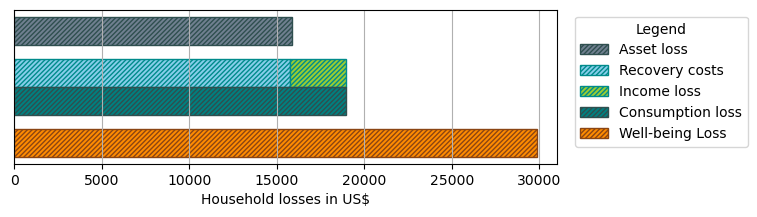

In [32]:
sum_data = pd.DataFrame(bg_const_v[['ave_damage', 'welfare_loss','recovery_costs', 'income_loss', 'consump_loss']].mean()).T
# Define the colors
colors = ['slategray', 'teal', 'darkorange']
color = ['skyblue', 'yellowgreen']
custom_cmap = ListedColormap(color)
bar_width = 0.1

# Plot the summed data
ax = sum_data['ave_damage'].plot(hatch='///////',edgecolor='darkslategrey',kind='barh', figsize=[7, 2],stacked=False, position=0.5, color=colors[0], width=bar_width)#, legend=True)
sum_data[['recovery_costs', 'income_loss']].plot(hatch='///////',edgecolor='darkcyan',kind="barh", ax=ax, stacked=True, position=2, cmap=custom_cmap, width=bar_width)#, legend=True)
sum_data['consump_loss'].plot(hatch='///////',edgecolor='darkslategrey',kind="barh", ax=ax, stacked=False, position=3, color=colors[1], width=bar_width)#, legend=True)
sum_data['welfare_loss'].plot(hatch='///////',edgecolor='saddlebrown',kind="barh", ax=ax, stacked=False, position=4.5, color=colors[2], width=bar_width)#, legend=True)

ax.set_xlabel('Household losses in US$')
# ax.set_title('Average household losses, control event')
plt.axis('tight')
ax.grid(True)
ax.set_xlim(0, 31000)
ax.set_yticks([])

ax.legend(loc='upper left', bbox_to_anchor=(1.02, 1), title='Legend', labels=['Asset loss','Recovery costs','Income loss', 'Consumption loss','Well-being Loss'])

# Save the plot if required
if save_figures:
    plt.savefig(f'{folder}/bar plot, control event, of average household losses.jpg', dpi=500, bbox_inches='tight')

In [33]:
# bg_no_insurance.sort_values(by='ave_i_0',ascending=True).head(5)

#### map of income?

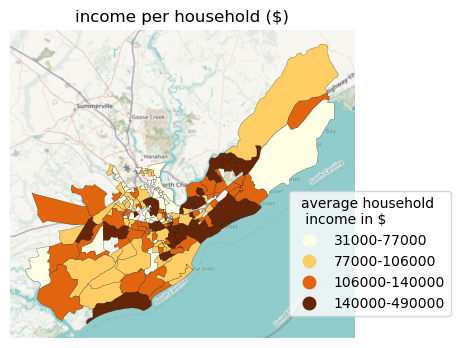

In [35]:
f, ax = plt.subplots(figsize=(10, 4))
# f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax, column='ave_i_0', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, scheme='QUANTILES', k=4)

ax.set_title('income per household ($)')

ax.set_aspect(1.2) 
ax.axis('off')
cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False)
ax.set_aspect(1.2) 
legend = ax.get_legend()
legend.set_bbox_to_anchor((1.3, 0.5))

legend.set_title('average household \n income in $')

leg = round_legend(bg_no_insurance, 'ave_i_0',4, 1000)
for interval, legend_label in zip(leg[0], leg[1]):
    legend_label.set_text(interval)

# if save_figures == True:
#     f.savefig(f'{folder}/income per household.png', dpi=1000, bbox_inches='tight')

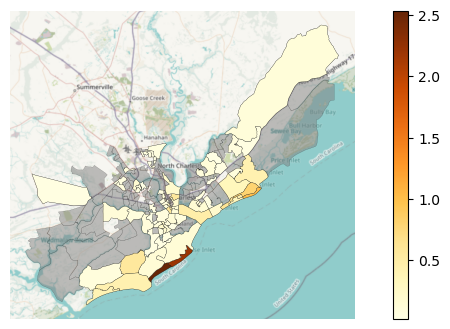

In [36]:
f, ax = plt.subplots(figsize=(10, 4))
# f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax,color='grey', categorical=False, linewidth=0.15, edgecolor='k',alpha=0.5)
bg_og.plot(ax=ax, column='recovery_time', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)#, scheme='QUANTILES', k=4)

cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False)
ax.set_aspect(1.2) 
ax.axis('off')

if save_figures == True:
    f.savefig(f'{folder}/map, actual event recovery time in years.jpg', dpi=1000, bbox_inches='tight')

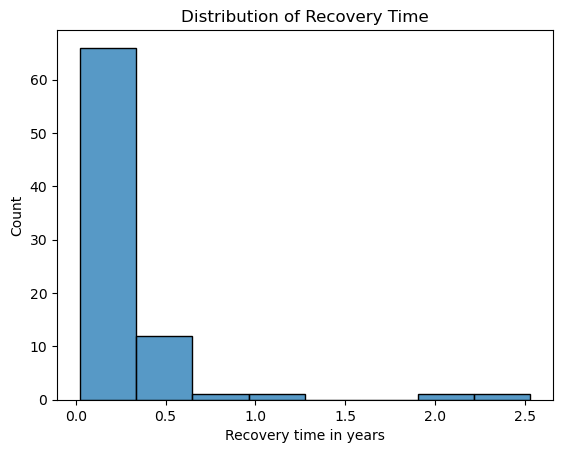

In [37]:
fig = sns.histplot(data=bg_og['recovery_time'], binwidth=0.3)
plt.xlabel('Recovery time in years')
plt.title('Distribution of Recovery Time')

if save_figures == True:
    plt.savefig(f'{folder}/histogram, actual event, recovery time.jpg', dpi=300, bbox_inches='tight')

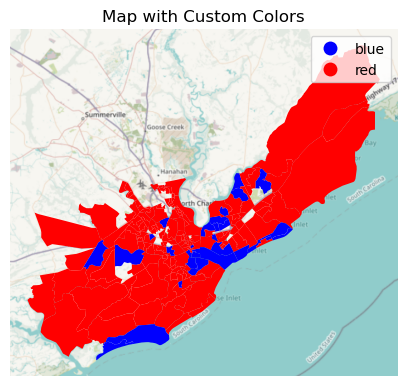

In [38]:
# Create a new column 'color' based on the condition
bg_no_insurance['color'] = 'blue'  # Default color
bg_no_insurance.loc[bg_no_insurance['welfare_loss'] > bg_no_insurance['ave_damage'], 'color'] = 'red'

colors = ['blue', 'red']
cmap = ListedColormap(colors)

# Plot the GeoDataFrame using the custom colormap
fig, ax = plt.subplots(figsize=(5, 5))
bg_no_insurance.plot(ax=ax, column='color', legend=True, cmap=cmap)
plt.title('Map with Custom Colors')
cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False)
ax.set_aspect(1.2) 
ax.axis('off')
plt.show()

In [39]:
# Create a new column 'color' based on the condition
bg_no_insurance['color'] = 'well-being loss < asset loss'  # Default color
bg_no_insurance.loc[bg_no_insurance['welfare_loss'] > bg_no_insurance['ave_damage'], 'color'] = 'well-being loss > asset loss'

In [40]:
# Create a new column 'color' based on the condition
bg_const_v['color'] = 'well-being loss < asset loss'  # Default color
bg_const_v.loc[bg_const_v['welfare_loss'] > bg_const_v['ave_damage'], 'color'] = 'well-being loss > asset loss'

In [41]:
# Adjust the existing colormap ('OrRd' as an example)
cmap_yl = plt.cm.YlOrBr  # Use the existing colormap
cmap_bl = plt.cm.Blues  # Use the existing colormap
colors_yl = cmap_yl(np.linspace(0.3, 1, 256))  #256 Take a higher range of the colormap to make it bold
colors_bl = cmap_bl(np.linspace(0.3, 1, 256))  # Take a higher range of the colormap to make it bold
bold_cmap_yl = LinearSegmentedColormap.from_list("BoldYlOrBr", colors_yl)
bold_cmap_bl = LinearSegmentedColormap.from_list("BoldBlues", colors_bl)

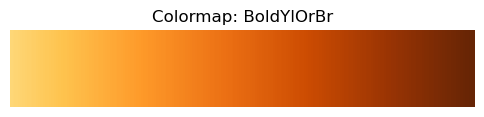

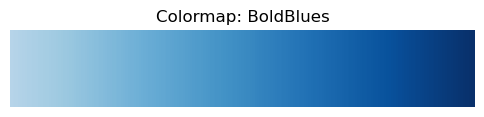

In [42]:
# Function to display the colormap
def display_cmap(cmap, name):
    gradient = np.linspace(0, 1, 256).reshape(1, -1)
    fig, ax = plt.subplots(figsize=(6, 1))
    ax.imshow(gradient, aspect="auto", cmap=cmap)
    ax.set_title(f"Colormap: {name}", fontsize=12)
    ax.set_axis_off()
    plt.show()

# Display the custom colormaps
display_cmap(bold_cmap_yl, "BoldYlOrBr")
display_cmap(bold_cmap_bl, "BoldBlues")

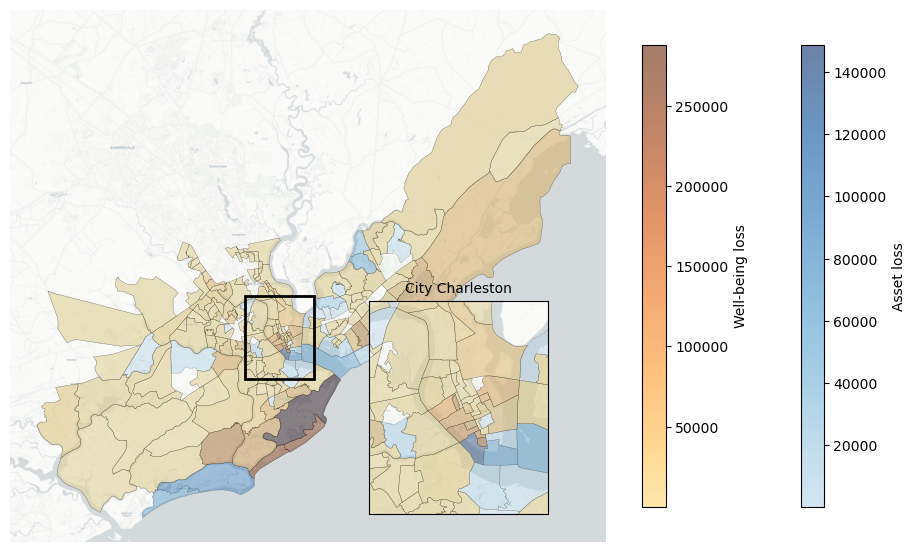

In [43]:
# Filter the GeoDataFrame to only include rows where 'color' is 'orange'
filtered_data = bg_no_insurance[bg_no_insurance['color'] == 'well-being loss > asset loss']

# Plot the GeoDataFrame using the filtered data
fig, ax = plt.subplots(figsize=(12, 12))
bg_no_insurance.plot(ax=ax, column='ave_damage', legend=True,legend_kwds={"shrink":.5,'alpha':0.6,"label":"Asset loss"}, cmap=bold_cmap_bl, linewidth=0.2, edgecolor='black', alpha=0.4)
filtered_data.plot(ax=ax, column='welfare_loss', legend=True,legend_kwds={"shrink":.5, 'alpha':0.6, "label":"Well-being loss"}, cmap=bold_cmap_yl, linewidth=0.2, edgecolor='black', alpha=0.4)

ax.set_aspect(1.2)

# Define the zoomed-in area bounds
zoom_x_min, zoom_x_max = -80.0, -79.9  # Longitude bounds
zoom_y_min, zoom_y_max = 32.74, 32.84  # Latitude bounds

# Add a rectangle to indicate the zoomed-in area on the main map
rect = Rectangle((zoom_x_min, zoom_y_min),  # Bottom-left corner
                 zoom_x_max - zoom_x_min,  # Width
                 zoom_y_max - zoom_y_min,  # Height
                 linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Add a magnified inset
inset_ax = inset_axes(ax, width="40%", height="40%", loc="lower right", borderpad=2)
bg_no_insurance.plot(ax=inset_ax, column='ave_damage', cmap=bold_cmap_bl, linewidth=0.2, edgecolor='black', alpha=0.4)
filtered_data.plot(ax=inset_ax, column='welfare_loss', cmap=bold_cmap_yl, linewidth=0.2, edgecolor='black', alpha=0.4)

cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=14, attribution=False)
cx.add_basemap(ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)

# cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False) # low quality
# cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, attribution=False) # low quality

# Set the zoomed-in area in the inset
inset_ax.set_xlim([zoom_x_min, zoom_x_max])
inset_ax.set_ylim([zoom_y_min, zoom_y_max])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title('City Charleston', fontsize=10)
ax.axis('off')

fig.savefig(f'{folder}/maps, extreme event, asset loss and welfare loss no insurance, with zoomed.jpg', dpi=600, bbox_inches='tight')

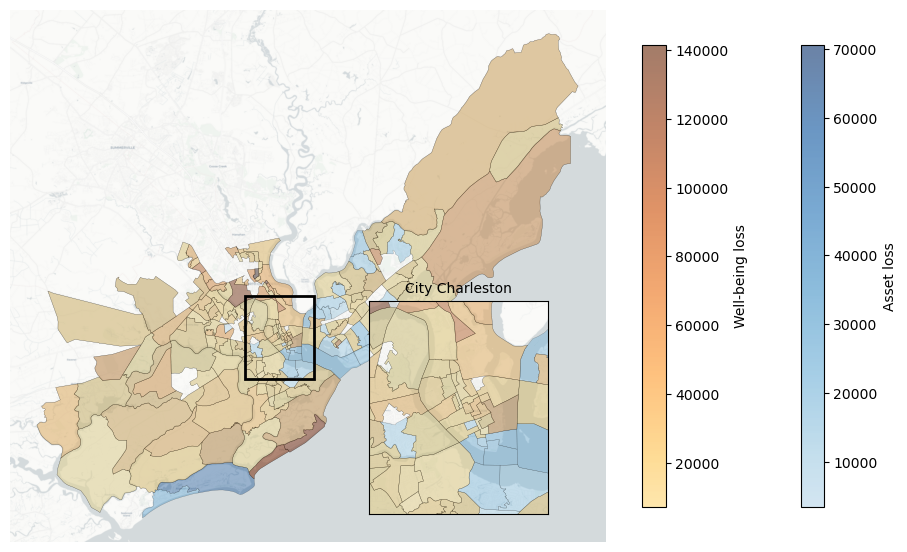

In [44]:
# Filter the GeoDataFrame to only include rows where 'color' is 'orange'
filtered_data = bg_const_v[bg_const_v['color'] == 'well-being loss > asset loss']

# Plot the GeoDataFrame using the filtered data
fig, ax = plt.subplots(figsize=(12, 12))
bg_const_v.plot(ax=ax, column='ave_damage', legend=True,legend_kwds={"shrink":.5,'alpha':0.6,"label":"Asset loss"}, cmap=bold_cmap_bl, linewidth=0.2, edgecolor='black', alpha=0.4)
filtered_data.plot(ax=ax, column='welfare_loss', legend=True,legend_kwds={"shrink":.5, 'alpha':0.6, "label":"Well-being loss"}, cmap=bold_cmap_yl, linewidth=0.2, edgecolor='black', alpha=0.4)

ax.set_aspect(1.2)

# Define the zoomed-in area bounds
zoom_x_min, zoom_x_max = -80.0, -79.9  # Longitude bounds
zoom_y_min, zoom_y_max = 32.74, 32.84  # Latitude bounds

# Add a rectangle to indicate the zoomed-in area on the main map
rect = Rectangle((zoom_x_min, zoom_y_min),  # Bottom-left corner
                 zoom_x_max - zoom_x_min,  # Width
                 zoom_y_max - zoom_y_min,  # Height
                 linewidth=2, edgecolor='black', facecolor='none')
ax.add_patch(rect)

# Add a magnified inset
inset_ax = inset_axes(ax, width="40%", height="40%", loc="lower right", borderpad=2)
bg_const_v.plot(ax=inset_ax, column='ave_damage', cmap=bold_cmap_bl, linewidth=0.2, edgecolor='black', alpha=0.4)
filtered_data.plot(ax=inset_ax, column='welfare_loss', cmap=bold_cmap_yl, linewidth=0.2, edgecolor='black', alpha=0.4)

cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=14, attribution=False)
cx.add_basemap(ax, crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)

# cx.add_basemap(ax=ax, crs=bg_no_insurance.crs, attribution=False) # low quality
# cx.add_basemap(inset_ax, crs=bg_no_insurance.crs, attribution=False) # low quality

# Set the zoomed-in area in the inset
inset_ax.set_xlim([zoom_x_min, zoom_x_max])
inset_ax.set_ylim([zoom_y_min, zoom_y_max])
inset_ax.set_xticks([])
inset_ax.set_yticks([])
inset_ax.set_title('City Charleston', fontsize=10)
ax.axis('off')

fig.savefig(f'{folder}/maps, control event, asset loss and welfare loss no insurance, with zoomed.jpg', dpi=600, bbox_inches='tight')

In [227]:
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
from matplotlib.patches import Rectangle
import contextily as cx

# Create a new column 'color' based on the condition
bg_no_insurance['color'] = 'green'  # Default color
bg_no_insurance.loc[bg_no_insurance['welfare_loss'] > bg_no_insurance['ave_damage'], 'color'] = 'orange'

colors = ['green', 'orange']
cmap = ListedColormap(colors)



(-80.3392635, -79.4784145, 32.543873600000005, 33.1856224)

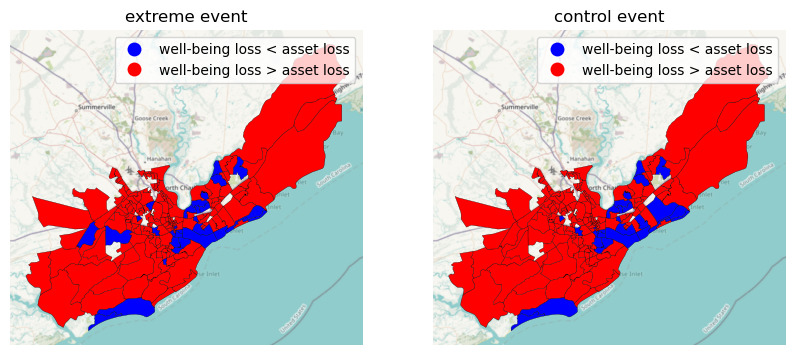

In [46]:
bg_no_insurance['color'] = 'well-being loss < asset loss'  # Default 
bg_no_insurance.loc[bg_no_insurance['welfare_loss'] > bg_no_insurance['ave_damage'], 'color'] = 'well-being loss > asset loss'

bg_const_v['color'] = 'well-being loss < asset loss'  # Default 
bg_const_v.loc[bg_const_v['welfare_loss'] > bg_const_v['ave_damage'], 'color'] = 'well-being loss > asset loss'

colors = ['blue', 'red']
cmap = ListedColormap(colors)

# Create side-by-side plots
fig, ax = plt.subplots(1, 2, figsize=(10, 5))  # 1 row, 2 columns

bg_no_insurance.plot(ax=ax[0], column='color', legend=True, cmap=cmap, linewidth=0.2, edgecolor='black')
bg_const_v.plot(ax=ax[1], column='color', legend=True, cmap=cmap, linewidth=0.2,  edgecolor='black')

ax[0].set_title('extreme event')
ax[1].set_title('control event')

cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_const_v.crs, attribution=False)

ax[0].set_aspect(1.2)
ax[1].set_aspect(1.2)

ax[0].axis('off')
ax[1].axis('off')

#### map average asset loss &  average welfare loss

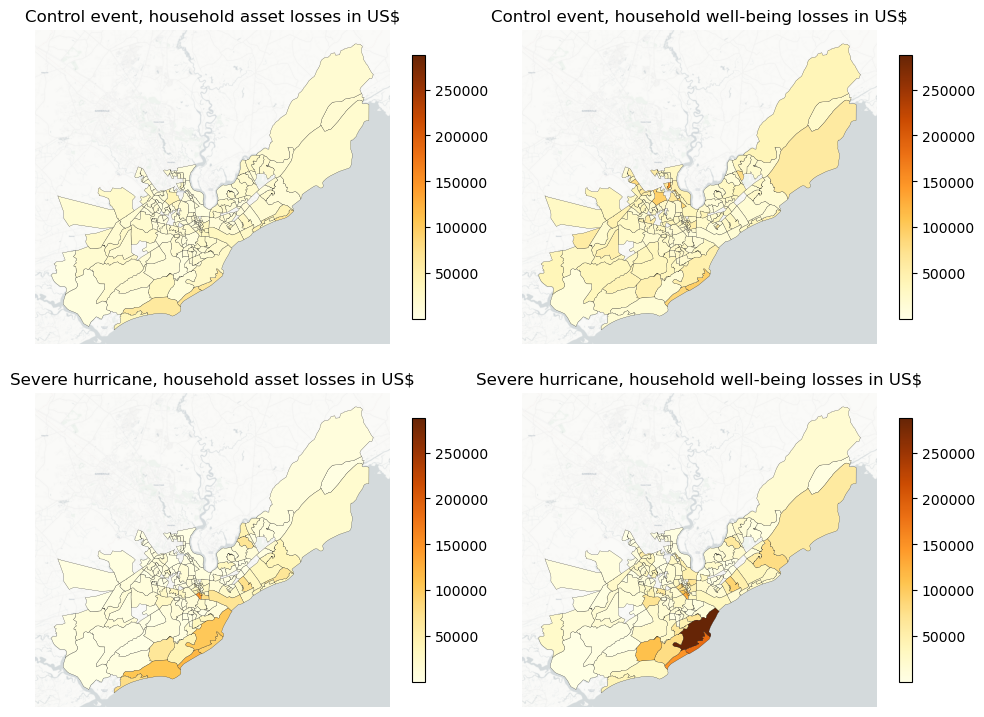

In [321]:
min_value = min(bg_no_insurance['ave_damage'].min(), bg_no_insurance['welfare_loss'].min(),
                bg_const_v['ave_damage'].min(), bg_const_v['welfare_loss'].min())
max_value = max(bg_no_insurance['ave_damage'].max(), bg_no_insurance['welfare_loss'].max(),
               bg_const_v['ave_damage'].max(), bg_const_v['welfare_loss'].max())

f, ax = plt.subplots(2, 2, figsize=(12, 9))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots
f.subplots_adjust(hspace=0.1)
    
bg_const_v.plot(ax=ax[0,0], column='ave_damage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value, legend_kwds={'shrink': 0.8})
bg_const_v.plot(ax=ax[0,0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_const_v.plot(ax=ax[0,1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value, legend_kwds={'shrink': 0.8})
bg_const_v.plot(ax=ax[0,1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

bg_no_insurance.plot(ax=ax[1,0], column='ave_damage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value, legend_kwds={'shrink': 0.8})
bg_no_insurance.plot(ax=ax[1,0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_no_insurance.plot(ax=ax[1,1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value, legend_kwds={'shrink': 0.8})
bg_no_insurance.plot(ax=ax[1,1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0,0].set_title('Control event, household asset losses in US$')
ax[0,1].set_title('Control event, household well-being losses in US$')
ax[1,0].set_title('Severe hurricane, household asset losses in US$')
ax[1,1].set_title('Severe hurricane, household well-being losses in US$')

# cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False) # low quality basemap
# cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False) # low quality basemap

cx.add_basemap(ax=ax[0,0], crs=bg_const_v.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)
cx.add_basemap(ax=ax[0,1], crs=bg_const_v.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)
cx.add_basemap(ax=ax[1,0], crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)
cx.add_basemap(ax=ax[1,1], crs=bg_no_insurance.crs, source=cx.providers.CartoDB.Positron, zoom=12, attribution=False)

for i in range(2):
    for j in range(2):
        ax[i, j].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, both events, 4panel, asset loss and welfare loss no insurance.jpg', dpi=600, bbox_inches='tight')

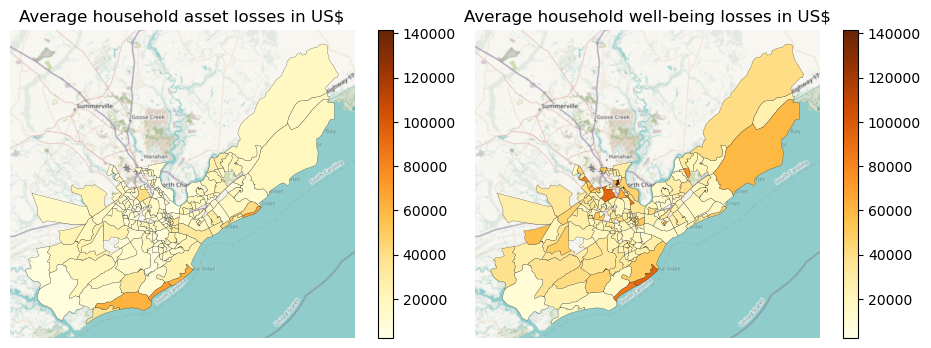

In [239]:
min_value = min(bg_const_v['ave_damage'].min(), bg_const_v['welfare_loss'].min())
max_value = max(bg_const_v['ave_damage'].max(), bg_const_v['welfare_loss'].max())

f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.001)  # Adjust the width space between subplots

bg_const_v.plot(ax=ax[0], column='ave_damage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_const_v.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_const_v.plot(ax=ax[1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_const_v.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')


ax[0].set_title('Average household asset losses in US$')
ax[1].set_title('Average household well-being losses in US$')
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, control event, asset loss and welfare loss no insurance.jpg', dpi=600, bbox_inches='tight')

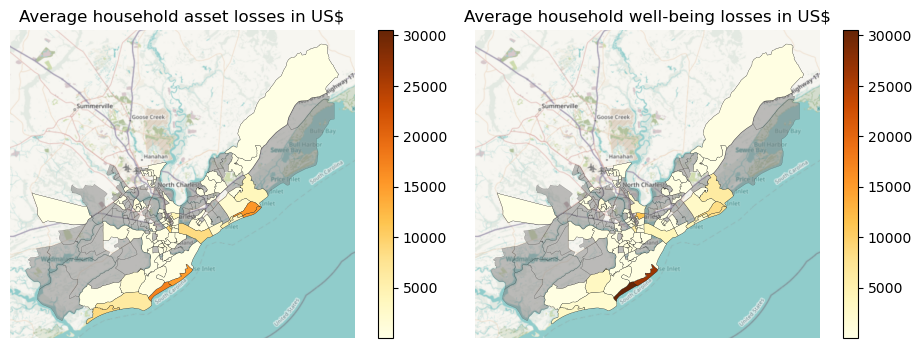

In [50]:
min_value = min(bg_og['ave_damage'].min(), bg_og['welfare_loss'].min())
max_value = max(bg_og['ave_damage'].max(), bg_og['welfare_loss'].max())

f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.001)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0],color='grey', categorical=False, linewidth=0.15, edgecolor='k',alpha=0.5)
bg_og.plot(ax=ax[0], column='ave_damage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[1],color='grey', categorical=False, linewidth=0.15, edgecolor='k',alpha=0.5)
bg_og.plot(ax=ax[1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)

ax[0].set_title('Average household asset losses in US$')
ax[1].set_title('Average household well-being losses in US$')
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, actual event, asset loss and welfare loss no insurance.jpg', dpi=600, bbox_inches='tight')

(-80.3392635, -79.4784145, 32.543873600000005, 33.1856224)

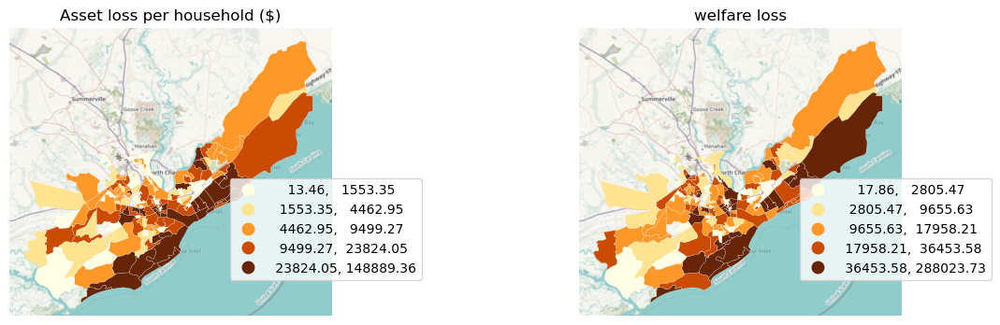

In [51]:
f, ax = plt.subplots(1, 2, figsize=(15, 4))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0], column='ave_damage', categorical=False, 
                    linewidth=0.15, edgecolor='white', cmap='YlOrBr', legend=True, scheme='QUANTILES', k=5)
bg_no_insurance.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

bg_no_insurance.plot(ax=ax[1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='white', cmap='YlOrBr', legend=True, scheme='QUANTILES', k=5)
bg_no_insurance.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0].set_title('Asset loss per household ($)')
ax[1].set_title('welfare loss')

legend = ax[0].get_legend()
legend.set_bbox_to_anchor((1.3, 0.5))
legend = ax[1].get_legend()
legend.set_bbox_to_anchor((1.3, 0.5))

cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)
for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

# if save_figures == True:
#     f.savefig(f'{folder}/maps asset loss and loss ratio.png', dpi=1000, bbox_inches='tight')

#### map building damage (??) & recovery time in years

(-80.3392635, -79.4784145, 32.543873600000005, 33.1856224)

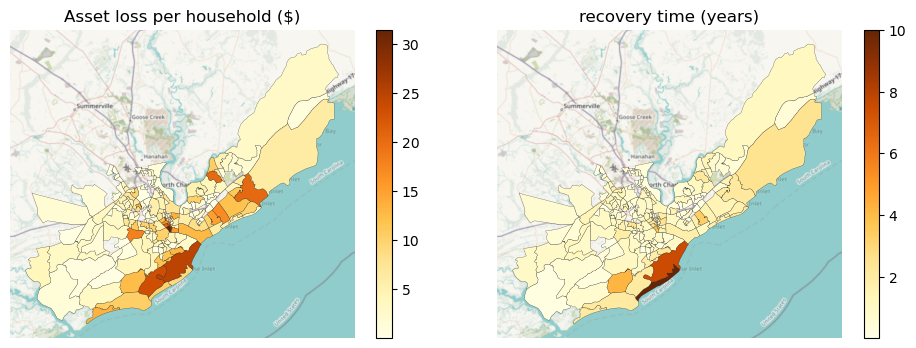

In [53]:
f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0], column='v_percentage', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)
bg_no_insurance.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_no_insurance.plot(ax=ax[1], column='recovery_time', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)
bg_no_insurance.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0].set_title('Asset loss per household ($)')
ax[1].set_title('recovery time (years)')
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

# if save_figures == True:
#     f.savefig(f'{folder}/maps asset loss and loss ratio.png', dpi=1000, bbox_inches='tight')

#### map welfare loss lambda not optimized & welfare loss lambda optimized

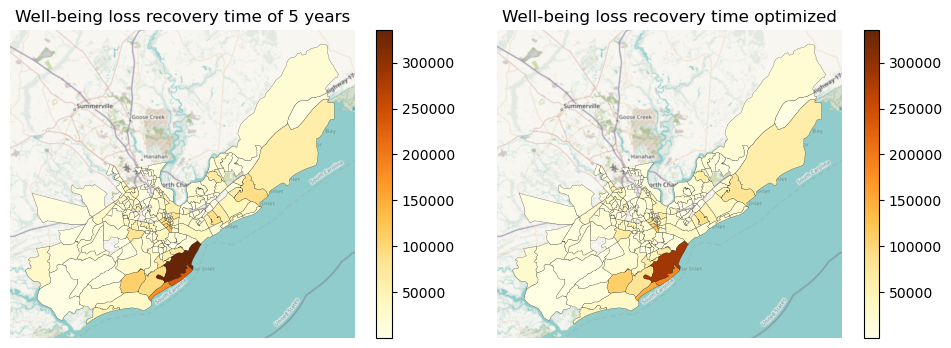

In [55]:
min_value = min(bg_lab_not_opt['welfare_loss'].min(), bg_no_insurance['welfare_loss'].min())
max_value = max(bg_lab_not_opt['welfare_loss'].max(), bg_no_insurance['welfare_loss'].max())

f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_lab_not_opt.plot(ax=ax[0], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_no_insurance.plot(ax=ax[1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0].set_title('Well-being loss recovery time of 5 years')
ax[1].set_title('Well-being loss recovery time optimized')
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, extreme event, sensitivity recovery time.jpg', dpi=1000, bbox_inches='tight')

#### results per income group → damage & welfare loss & income loss

In [57]:
colors = ['slategray', 'darkorange', 'yellowgreen']
categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']

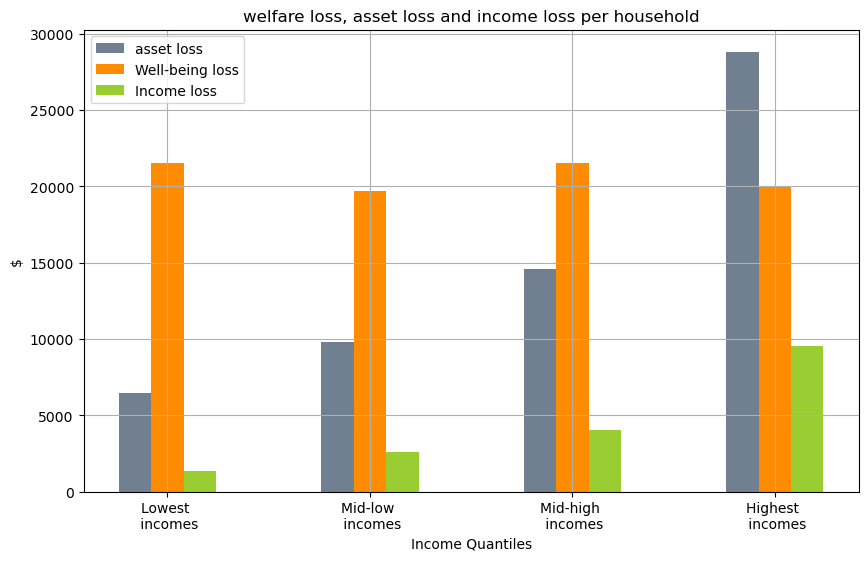

In [58]:
bar_width=0.16

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.5, color=colors[0],width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.5, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('$')
ax.set_xlabel('Income Quantiles')
ax.set_title(f'welfare loss, asset loss and income loss per household')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
# ax.set_ylim(0, 27000)
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(['asset loss', 'Well-being loss', 'Income loss'])

if save_figures == True:
    plt.savefig(f'Quantiles, extreme event.jpg',dpi=500, bbox_inches='tight')

In [59]:
bg_og['owner_households'].sum()

35630

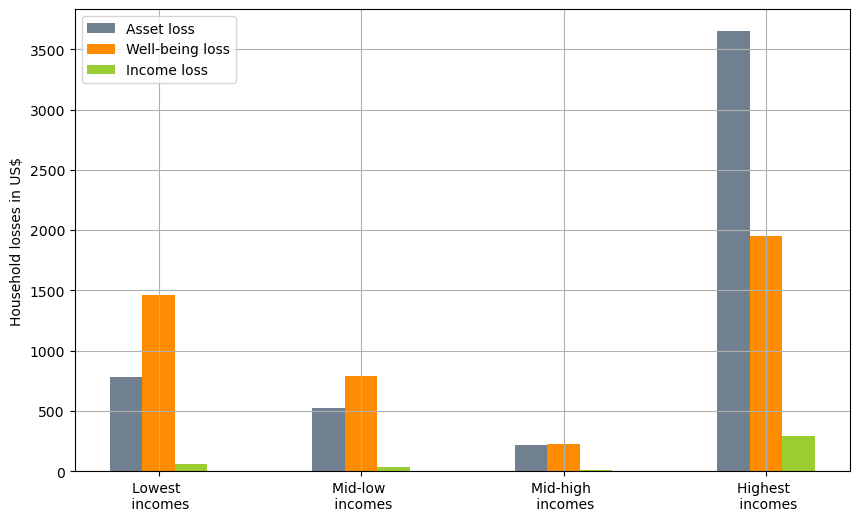

In [60]:
bar_width=0.16
colors = ['slategray', 'darkorange', 'yellowgreen']
ax = data_quantiles_og['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.5, color=colors[0],width=bar_width)
data_quantiles_og['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_og['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.5, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'welfare loss, asset loss and income loss per household')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
# ax.set_ylim(0, 27000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(['Asset loss', 'Well-being loss', 'Income loss'])

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, actual event.jpg',dpi=500, bbox_inches='tight')

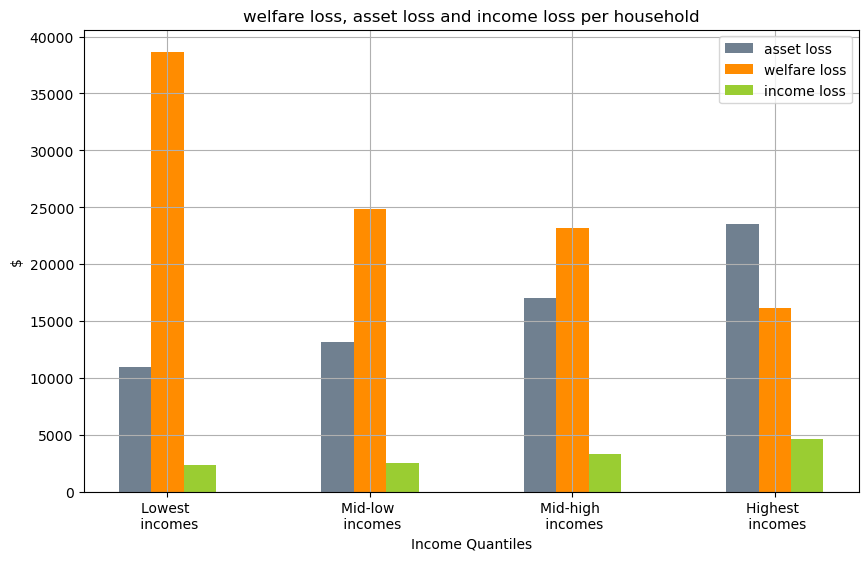

In [61]:
bar_width=0.16
colors = ['slategray', 'darkorange', 'yellowgreen']
ax = data_quantiles_const_v['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.5, color=colors[0],width=bar_width)
data_quantiles_const_v['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_const_v['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.5, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('$')
ax.set_xlabel('Income Quantiles')
ax.set_title(f'welfare loss, asset loss and income loss per household')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
# ax.set_ylim(0, 27000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(['asset loss', 'welfare loss', 'income loss'])

if save_figures == True:
    plt.savefig(f'Quantiles, control event.jpg',dpi=500, bbox_inches='tight')

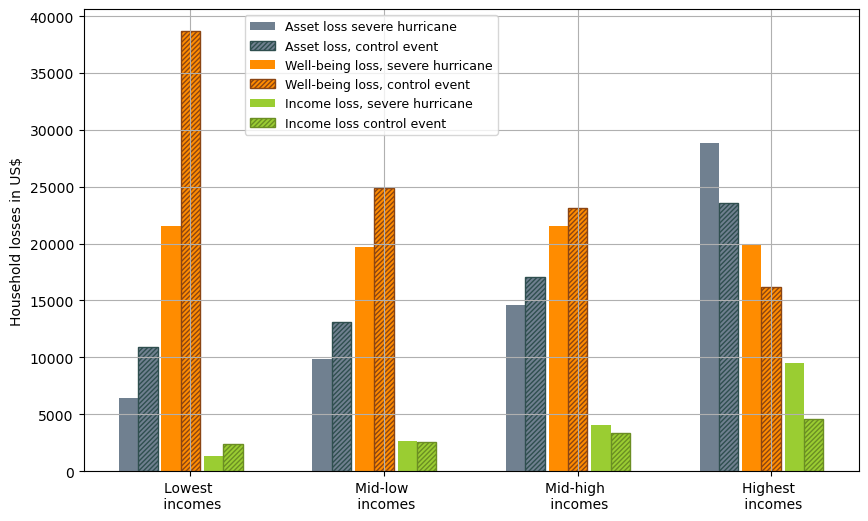

In [62]:
bar_width=0.1
colors = ['slategray', 'darkorange', 'yellowgreen']
colors_lab = ['gold', 'darkgreen']

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=3.7, color=colors[0],width=bar_width)
data_quantiles_const_v['damage'].plot(hatch='///////',edgecolor='darkslategray',kind="bar", ax=ax, stacked=False, position=2.7, color=colors[0], width=bar_width)

data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=1.5, color=colors[1], width=bar_width)
data_quantiles_const_v['welfare_loss'].plot(hatch='///////',edgecolor='saddlebrown',kind='bar',ax=ax, stacked=False, position=0.5, color=colors[1],width=bar_width)

data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.7, color=colors[2], width=bar_width)
data_quantiles_const_v['income_loss'].plot(hatch='///////',edgecolor='olivedrab',kind="bar", ax=ax, stacked=False, position=-1.7, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'Losses per household, extreme event and control event')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
# ax.set_ylim(0, 35000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

ax.legend(bbox_to_anchor=(0.2, 1), loc='upper left',labels=['Asset loss severe hurricane','Asset loss, control event', 'Well-being loss, severe hurricane', 'Well-being loss, control event', 'Income loss, severe hurricane', 'Income loss control event'], fontsize=9)

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, extreme event & control event.jpg',dpi=500, bbox_inches='tight')

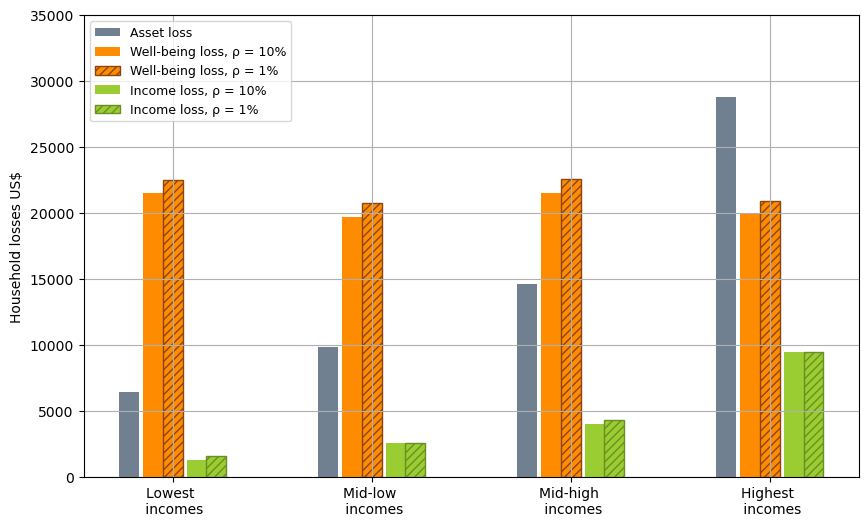

In [63]:
bar_width=0.1
colors = ['slategray', 'darkorange', 'yellowgreen']
colors_lab = ['gold', 'darkgreen']

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=2.7, color=colors[0],width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=1.5, color=colors[1], width=bar_width)
data_quantiles_disc1['welfare_loss'].plot(hatch='////',edgecolor='saddlebrown',kind='bar',ax=ax, stacked=False, position=0.5, color=colors[1],width=bar_width)

data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.7, color=colors[2], width=bar_width)
data_quantiles_disc1['income_loss'].plot(hatch='////',edgecolor='olivedrab',kind="bar", ax=ax, stacked=False, position=-1.7, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('Household losses US$')
ax.set_xlabel('')
# ax.set_title(f'Losses per household, sensitivity of discount rate (\u03C1)')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
ax.set_ylim(0, 35000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

sensi_variant = '\u03C1 = 1%'
ax.legend(bbox_to_anchor=(0, 1), loc='upper left',labels=['Asset loss', 'Well-being loss, \u03C1 = 10%', f'Well-being loss, {sensi_variant}', 'Income loss, \u03C1 = 10%', f'Income loss, {sensi_variant}'], fontsize=9)

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, extreme event, sensitivity discount rate 1%.jpg',dpi=500, bbox_inches='tight')

In [64]:
bg_no_insurance['ave_damage'].sum()

2985707.735311113

In [65]:
bg_const_v['ave_damage'].sum()

2983055.0209996547

In [66]:
(data_quantiles_const_v.iloc[0]['damage']-data_quantiles_no_insurance.iloc[0]['damage'])/data_quantiles_no_insurance.iloc[0]['damage']*100

69.40451010237598

In [67]:
(data_quantiles_const_v.iloc[0]['welfare_loss']-data_quantiles_no_insurance.iloc[0]['welfare_loss'])/data_quantiles_no_insurance.iloc[0]['welfare_loss']*100

79.58500035013412

In [68]:
(data_quantiles_const_v.iloc[3]['damage']-data_quantiles_no_insurance.iloc[3]['damage'])/data_quantiles_no_insurance.iloc[3]['damage']*100

-18.267182904378622

In [69]:
(data_quantiles_const_v.iloc[3]['welfare_loss']-data_quantiles_no_insurance.iloc[3]['welfare_loss'])/data_quantiles_no_insurance.iloc[3]['welfare_loss']*100

-18.953585929320717

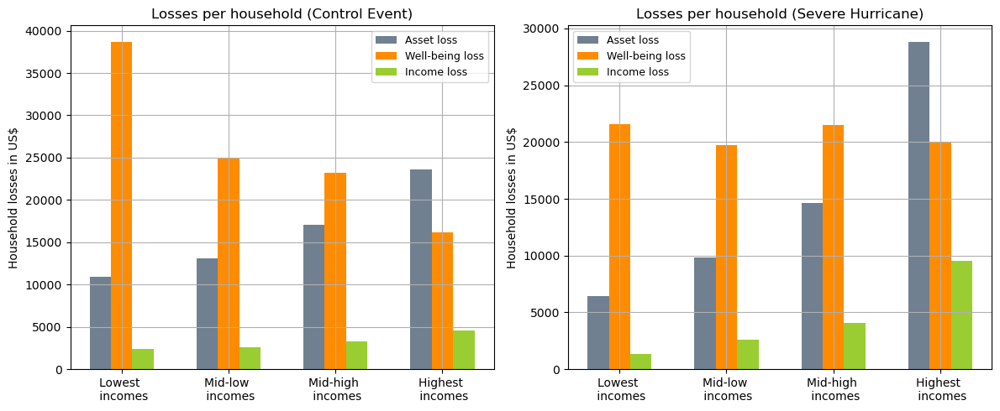

In [225]:
bar_width = 0.2
colors = ['slategray', 'darkorange', 'yellowgreen']

fig, axs = plt.subplots(1, 2, figsize=(12, 5))

ax1 = axs[0]
data_quantiles_const_v['damage'].plot(kind="bar", ax=ax1, stacked=False, position=1.5, color=colors[0], width=bar_width)
data_quantiles_const_v['welfare_loss'].plot(kind='bar', ax=ax1, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_const_v['income_loss'].plot(kind="bar", ax=ax1, stacked=False, position=-0.5, color=colors[2], width=bar_width)

ax1.set_ylabel('Household losses in US$')
ax1.set_xlabel('')
ax1.set_title('Losses per household (Control Event)')
ax1.grid(True)
ax1.axis('tight') 
ax1.set_xticks(range(4))
ax1.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
ax1.legend(['Asset loss', 'Well-being loss', 'Income loss'], fontsize=9, loc='upper right')

ax2 = axs[1]
data_quantiles_no_insurance['damage'].plot(kind='bar', ax=ax2, stacked=False, position=1.5, color=colors[0], width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax2, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax2, stacked=False, position=-0.5, color=colors[2], width=bar_width)

ax2.set_ylabel('Household losses in US$')
ax2.set_xlabel('')
ax2.set_title('Losses per household (Severe Hurricane)')
ax2.grid(True)
ax2.axis('tight')
ax2.set_xticks(range(4))
ax2.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
ax2.legend(['Asset loss', 'Well-being loss', 'Income loss'], fontsize=9, loc='upper left')

plt.tight_layout()

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles 2panel, both events, well-being and asset loss.jpg', dpi=500, bbox_inches='tight')

In [223]:
data_quantiles_no_insurance['damage']

Unnamed: 0
low_incomes          6438.722145
mid_low_incomes      9819.080353
mid_high_incomes    14602.733438
high_incomes        28824.496138
Name: damage, dtype: float64

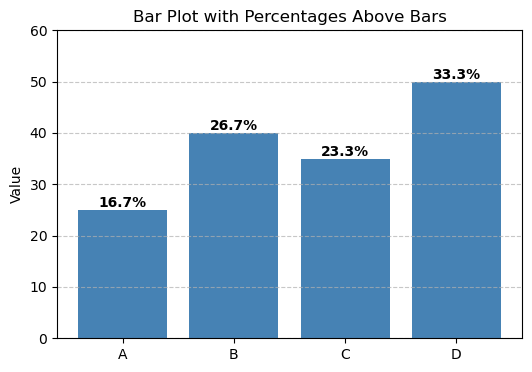

In [217]:
categories = ['A', 'B', 'C', 'D']
values = [25, 40, 35, 50]  # Example values (could be percentages)
total = sum(values)  # Total to compute percentages

fig, ax = plt.subplots(figsize=(6, 4))
bars = ax.bar(categories, values, color='steelblue')

# Add text above bars
for bar, value in zip(bars, values):
    percentage = f"{(value / total) * 100:.1f}%"  # Convert to percentage format
    ax.text(bar.get_x() + bar.get_width()/2, bar.get_height(), percentage,
            ha='center', va='bottom', fontsize=10, fontweight='bold')

# Labels and Formatting
ax.set_ylabel("Value")
ax.set_title("Bar Plot with Percentages Above Bars")
ax.set_ylim(0, max(values) * 1.2)  # Adjust y-limit for better visibility
ax.grid(axis='y', linestyle='--', alpha=0.7)

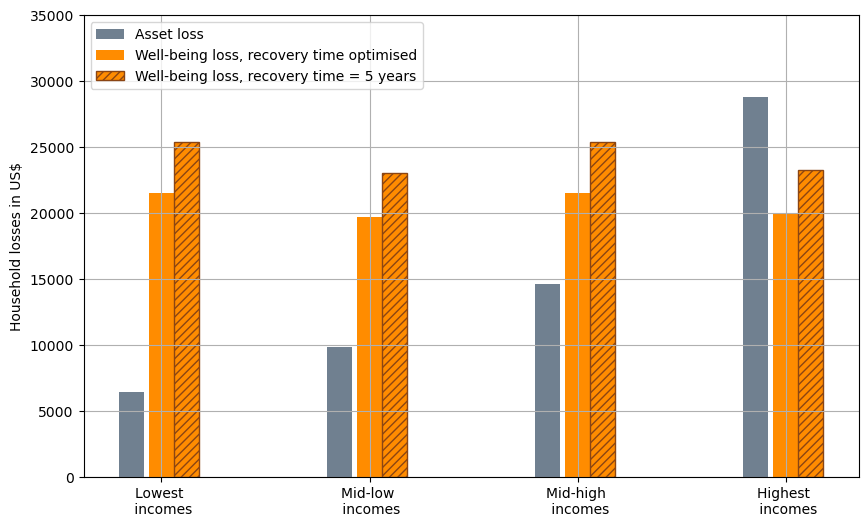

In [72]:
bar_width=0.12
colors = ['slategray', 'darkorange', 'yellowgreen']
colors_lab = ['gold', 'darkgreen']

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.7, color=colors[0],width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_lab_not_opt['welfare_loss'].plot(hatch='////',edgecolor='saddlebrown',kind='bar',ax=ax, stacked=False, position=-0.5, color=colors[1],width=bar_width)

# data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.7, color=colors[2], width=bar_width)
# data_quantiles_lab_not_opt['income_loss'].plot(hatch='////',edgecolor='olivedrab',kind="bar", ax=ax, stacked=False, position=-1.7, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'Losses per household, sensitivity of optimizing recovery time')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
ax.set_ylim(0, 35000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(loc='upper left',labels=['Asset loss', 'Well-being loss, recovery time optimised', 'Well-being loss, recovery time = 5 years', 'income loss, recovery time optimized', 'income loss, recovery time = 5 years'])

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, extreme event, sensitivity recovery_time only welfare.jpg',dpi=500, bbox_inches='tight')

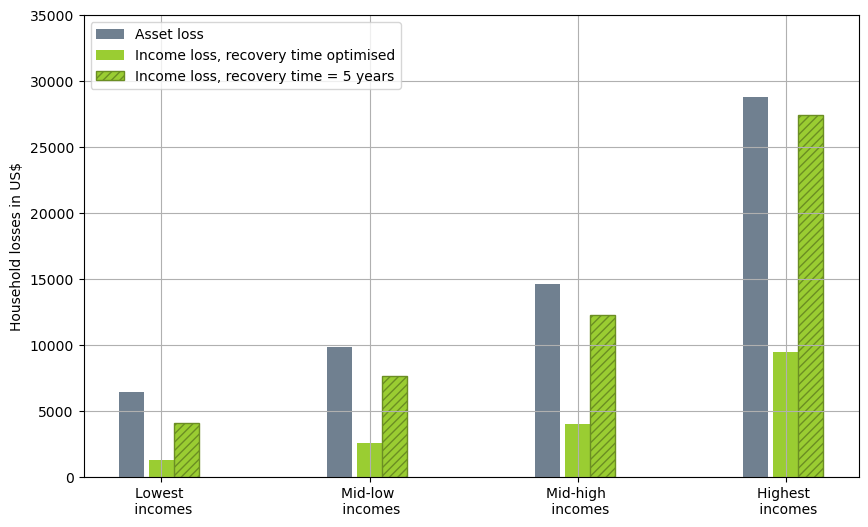

In [73]:
bar_width=0.12
colors = ['slategray','yellowgreen']

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.7, color=colors[0],width=bar_width)
data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_lab_not_opt['income_loss'].plot(hatch='////',edgecolor='olivedrab',kind='bar',ax=ax, stacked=False, position=-0.5, color=colors[1],width=bar_width)

# Set plot labels and title
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'Losses per household, sensitivity of optimizing recovery time')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
ax.set_ylim(0, 35000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(loc='upper left',labels=['Asset loss', 'Income loss, recovery time optimised', 'Income loss, recovery time = 5 years', 'income loss, recovery time optimized', 'income loss, recovery time = 5 years'])

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, extreme event, sensitivity recovery_time only income loss.jpg',dpi=500, bbox_inches='tight')

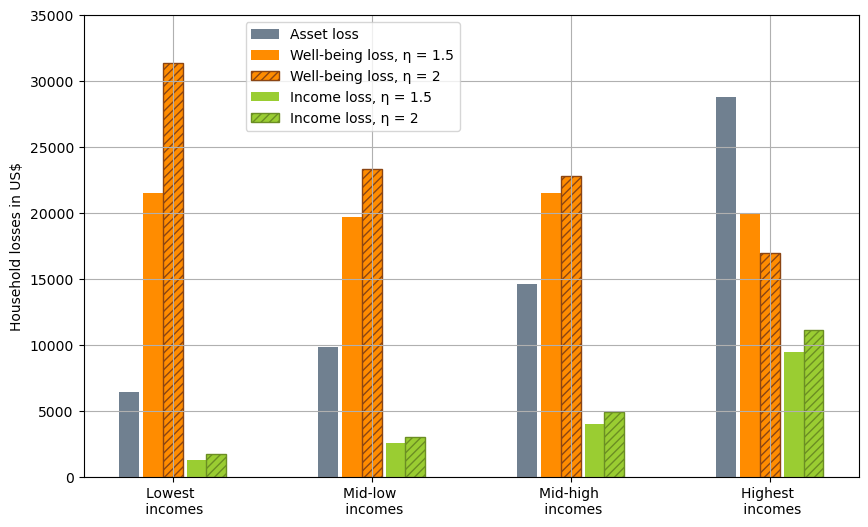

In [74]:
bar_width=0.1
colors = ['slategray', 'darkorange', 'yellowgreen']
colors_lab = ['gold', 'darkgreen']

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=2.7, color=colors[0],width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=1.5, color=colors[1], width=bar_width)
data_quantiles_eta_2['welfare_loss'].plot(hatch='////',edgecolor='saddlebrown',kind='bar',ax=ax, stacked=False, position=0.5, color=colors[1],width=bar_width)

data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.7, color=colors[2], width=bar_width)
data_quantiles_eta_2['income_loss'].plot(hatch='////',edgecolor='olivedrab',kind="bar", ax=ax, stacked=False, position=-1.7, color=colors[2], width=bar_width)

# Set plot labels and title
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'Losses per household, sensitivity of marginal elasticity of utility (\u03B7)')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
ax.set_ylim(0, 35000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(bbox_to_anchor=(0.2, 1), loc='upper left',labels=['Asset loss', 'Well-being loss, \u03B7 = 1.5', 'Well-being loss, \u03B7 = 2', 'Income loss, \u03B7 = 1.5', 'Income loss, \u03B7 = 2'])

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, extreme event, sensitivity eta=2.jpg',dpi=500, bbox_inches='tight')

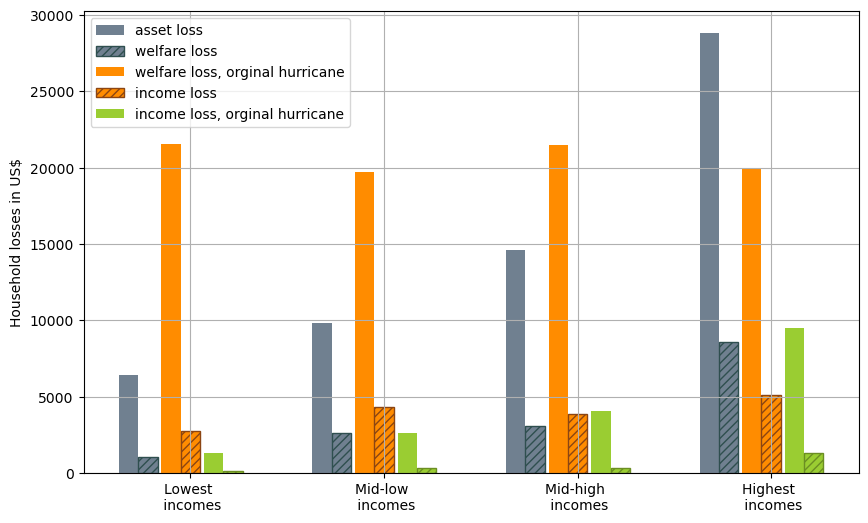

In [75]:
bar_width=0.1
colors = ['slategray', 'darkorange', 'yellowgreen']
colors_lab = ['gold', 'darkgreen']

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=3.7, color=colors[0],width=bar_width)
data_quantiles_25['damage'].plot(hatch='////',edgecolor='darkslategray',kind="bar", ax=ax, stacked=False, position=2.7, color=colors[0], width=bar_width)

data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=1.5, color=colors[1], width=bar_width)
data_quantiles_25['welfare_loss'].plot(hatch='////',edgecolor='saddlebrown',kind='bar',ax=ax, stacked=False, position=0.5, color=colors[1],width=bar_width)

data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.7, color=colors[2], width=bar_width)
data_quantiles_25['income_loss'].plot(hatch='////',edgecolor='olivedrab',kind="bar", ax=ax, stacked=False, position=-1.7, color=colors[2], width=bar_width)


# Set plot labels and title
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'Losses per household, sensitivity of asset loss scenario')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
# ax.set_ylim(0, 35000)
# ax.set_yscale('log')

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(['asset loss', 'welfare loss', 'welfare loss, orginal hurricane', 'income loss', 'income loss, orginal hurricane'])

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, extreme event, sensitivity input data, asset losses.jpg',dpi=500, bbox_inches='tight')

#### results per income group → income loss & consumption loss & welfare loss

In [77]:
# bar_width=0.16

# colors = ['slategray', 'darkorange', 'teal', 'salmon']
# color = ['skyblue', 'yellowgreen']
# custom_cmap = ListedColormap(color)

# ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.5, color=colors[0],width=bar_width)
# data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
# data_quantiles_no_insurance['consump_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.5, color=colors[2], width=bar_width)
# data_quantiles_no_insurance[['recovery_costs','income_loss']].plot(kind="bar", ax=ax, stacked=True, position=-1.5, width=bar_width, cmap=custom_cmap)
# data_quantiles_no_insurance['premium'].plot(kind="bar", ax=ax, stacked=False, position=-2.5, color=colors[3], width=bar_width)

# # Set plot labels and title
# ax.set_ylabel('$')
# ax.set_xlabel('Income Quantiles')
# ax.set_title(f'welfare loss, asset loss and income loss per household')
# ax.grid(True)
# plt.axis('tight')  # Adjust layout to reduce whitespace
# # ax.set_ylim(0, 27000)

# categories = ['lowest incomes', 'mid low \n incomes', 'mid high \n incomes', 'highest incomes']
# plt.xticks(range(len(categories)), categories, rotation=0)

# # Display the legend
# ax.legend(['asset loss','welfare loss', 'consumption loss', 'recovery costs','income loss'])

# if save_figures == True:
#     plt.savefig(f'results in Quantiles.png',dpi=500, bbox_inches='tight')

#### consumption curve of a ‘rich’ household and a ‘poor’ household, also include income loss and recovery cost

#### map welfare loss insurance & welfare loss without insurance

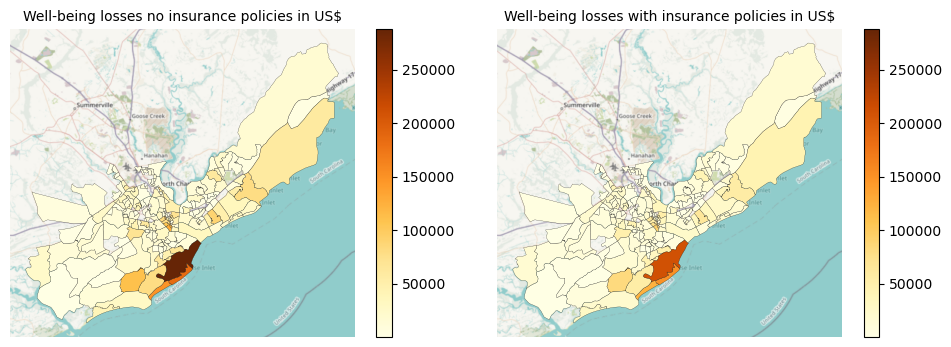

In [80]:
min_value = min(bg_base_insurance['welfare_loss'].min(), bg_no_insurance['welfare_loss'].min())
max_value = max(bg_base_insurance['welfare_loss'].max(), bg_no_insurance['welfare_loss'].max())

f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_base_insurance.plot(ax=ax[1], column='welfare_loss', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0].set_title('Well-being losses no insurance policies in US$', fontsize=10)
ax[1].set_title('Well-being losses with insurance policies in US$', fontsize=10)
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
# zoom_factor = 0.2 # Adjust this as needed
# for axis in ax:
#     xlim = axis.get_xlim()
#     ylim = axis.get_ylim()
#     # Adjusting the limits towards center bottom
#     axis.set_xlim(xlim[0] + (xlim[1] - xlim[0]) * (1 - zoom_factor) / 2, xlim[1] - (xlim[1] - xlim[0]) * (1 - zoom_factor) / 2)
#     axis.set_ylim(ylim[0], ylim[1] - (ylim[1] - ylim[0]) * (1 - zoom_factor) / 2)
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, extreme event, welfare losses with and without insurance.jpg', dpi=1000, bbox_inches='tight')

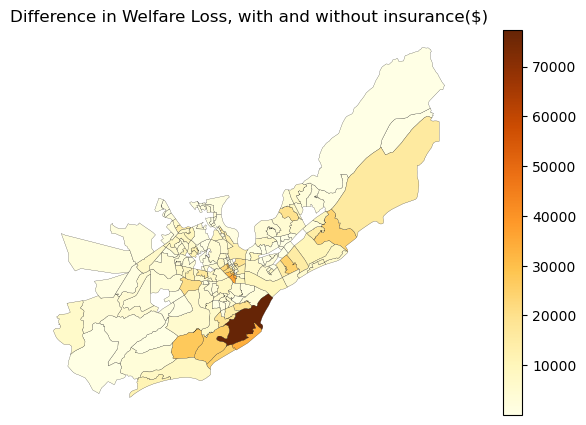

In [81]:
from matplotlib.colors import LinearSegmentedColormap

# Create a custom colormap transitioning from one color to another through white (neutral color at zero)
colors = [(0, 'blue'), (0.05, 'white'), (1, 'red')]
custom_cmap = LinearSegmentedColormap.from_list('custom_cmap', colors)

# Assuming you have bg_no_insurance and save_figures defined earlier
f, ax = plt.subplots(figsize=(10, 5))
bg_no_insurance.plot(ax=ax, column='diff_welfare_loss', categorical=False, 
                     linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)#, scheme='quantiles', k=12)
bg_no_insurance.plot(ax=ax, column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax.set_title('Difference in Welfare Loss, with and without insurance($)')
ax.set_aspect(1.2) 
ax.axis('off')
legend = ax.get_legend()
# legend.set_bbox_to_anchor((1.05, 0.5))
# legend.set_title('Change in Welfare Loss')

# leg = round_legend(bg_no_insurance, 'diff_welfare_loss',12, 10)
# for interval, legend_label in zip(leg[0], leg[1]):
#     legend_label.set_text(interval)
        
if save_figures:
    f.savefig(f'{folder}/map, difference_in_welfare_loss insurance.jpg', dpi=1000, bbox_inches='tight')

In [82]:
bg_no_insurance.iloc[13]

Unnamed: 0                                                             13
delta_w                                                          0.001538
income_loss                                                   6558.105051
consump_loss                                                 26472.064449
recovery_costs                                               19913.959399
W_frac                                                            0.21164
frac_consump_loss                                                0.349357
owner_households                                                       71
ave_i_0                                                      75773.684211
ave_c_0                                                      75773.684211
ave_damage                                                    19913.96626
labda                                                            1.488097
v                                                                0.128793
premium                               

In [83]:
bg_no_insurance['index_number'] = bg_no_insurance.index
high_income_data = bg_no_insurance[bg_no_insurance['Income_Category'] == 'low_incomes']

bg_no_insurance.explore(column='welfare_loss',cmap='YlOrBr',style_kwds=dict(color="black"), tooltip=["index_number",'welfare_loss', 'v', 'ave_i_0','Income_Category','recovery_time','fract_prem_i_0'])

In [84]:
min_value = min(bg_no_insurance['welfare_loss'].min(), bg_no_insurance['ave_damage'].min())
max_value = max(bg_no_insurance['welfare_loss'].max(), bg_no_insurance['ave_damage'].max())
# bg_base_insurance.explore(column='welfare_loss', cmap='YlOrBr', style_kwds=dict(color="black"), tooltip=["index_number",'welfare_loss', 'v', 'ave_i_0','Income_Category','recovery_time','fract_prem_i_0'], vmin=min_value, vmax=max_value)

bg_no_insurance.explore(column='welfare_loss', cmap='YlOrBr', style_kwds=dict(color="black"), tooltip=["index_number",'welfare_loss', 'v', 'ave_i_0','Income_Category','recovery_time','fract_prem_i_0'], vmin=min_value, vmax=max_value)

#### map recovery time insurance & recovery time without insurance

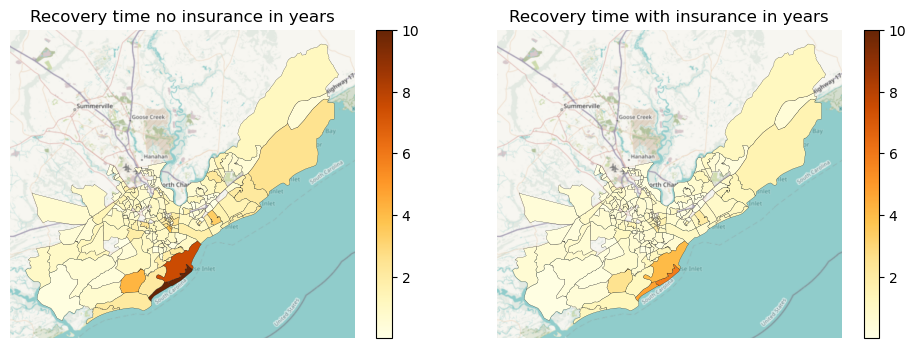

In [86]:
min_value = min(bg_base_insurance['recovery_time'].min(), bg_no_insurance['recovery_time'].min())
max_value = max(bg_base_insurance['recovery_time'].max(), bg_no_insurance['recovery_time'].max())

f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0], column='recovery_time', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[0], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')
bg_base_insurance.plot(ax=ax[1], column='recovery_time', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True, vmin=min_value, vmax=max_value)
bg_no_insurance.plot(ax=ax[1], column='welfare_no_damage',cmap='Greys', categorical=False, linewidth=0.15, edgecolor='k')

ax[0].set_title('Recovery time no insurance in years')
ax[1].set_title('Recovery time with insurance in years')
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)
for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, extreme event, recovery time with and without insurance.jpg', dpi=1000, bbox_inches='tight')

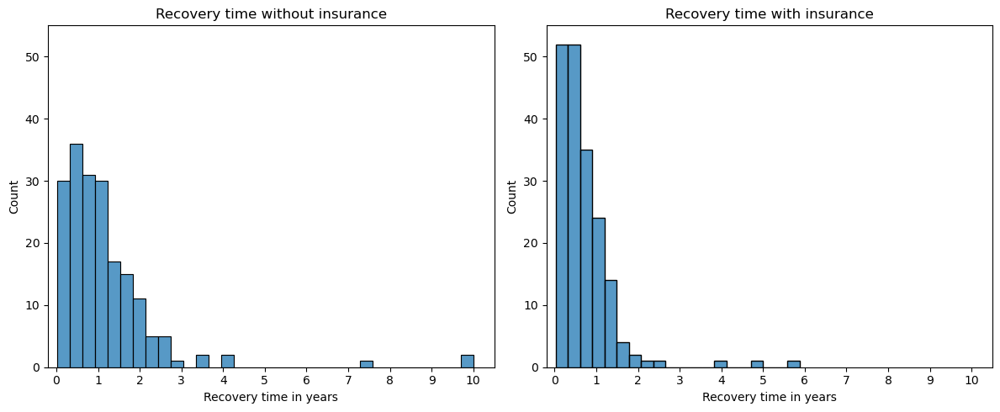

In [87]:
# Create a figure with two subplots
fig, axs = plt.subplots(1, 2, figsize=(12, 5))

sns.histplot(data=bg_no_insurance['recovery_time'], ax=axs[0], binwidth=0.3)
axs[0].set_title('Recovery time without insurance')

sns.histplot(data=bg_base_insurance['recovery_time'], ax=axs[1],binwidth=0.3)
axs[1].set_title('Recovery time with insurance')

for ax in axs:
    ax.set_xlabel('Recovery time in years')
    ax.set_xlim(-0.2, 10.5)
    ax.set_ylim(0, 55)
    ax.set_xticks(np.arange(0, 11, 1))  # Set x-axis ticks from 0 to 10 with step size 1
    ax.set_xticklabels(np.arange(0, 11, 1))

plt.tight_layout()
if save_figures == True:
    plt.savefig(f'{folder}/histogram, insurance, recovery time.jpg', dpi=300, bbox_inches='tight')

In [88]:
bg_no_insurance['take_up'] = bg_no_insurance.apply(lambda row: True if row['fract_prem_i_0'] < 7.5 else False, axis=1)

In [89]:
bg_no_insurance['premium_true'] = bg_no_insurance['premium'].where(bg_no_insurance['take_up'])
bg_no_insurance['frac_premium_true'] = bg_no_insurance['fract_prem_i_0'].where(bg_no_insurance['take_up'])

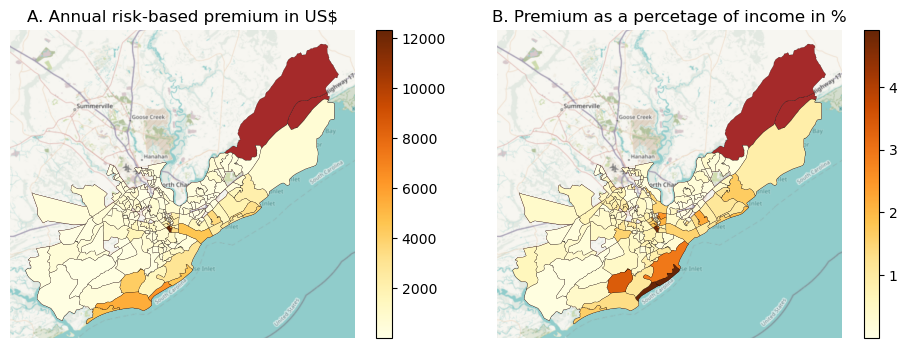

In [90]:
f, ax = plt.subplots(1, 2, figsize=(12, 4))
f.subplots_adjust(wspace=0.1)  # Adjust the width space between subplots

bg_no_insurance.plot(ax=ax[0], color='brown', categorical=False, linewidth=0.15, edgecolor='k')
bg_no_insurance.plot(ax=ax[0], column='premium_true', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)#, scheme='QUANTILES', k=10)

bg_no_insurance.plot(ax=ax[1], color='brown', categorical=False, linewidth=0.15, edgecolor='k')
bg_no_insurance.plot(ax=ax[1], column='frac_premium_true', categorical=False, 
                    linewidth=0.15, edgecolor='k', cmap='YlOrBr', legend=True)#, scheme='QUANTILES', k=10)

ax[0].set_title('A. Annual risk-based premium in US$')
ax[1].set_title('B. Premium as a percetage of income in %')
cx.add_basemap(ax=ax[0], crs=bg_no_insurance.crs, attribution=False)
cx.add_basemap(ax=ax[1], crs=bg_no_insurance.crs, attribution=False)

for axis in ax:
    axis.set_aspect(1.2) 
    
ax[0].axis('off')
ax[1].axis('off')

if save_figures == True:
    f.savefig(f'{folder}/maps, premiums.jpg', dpi=1000, bbox_inches='tight')

#### map premiums & map premiums as a fraction of income

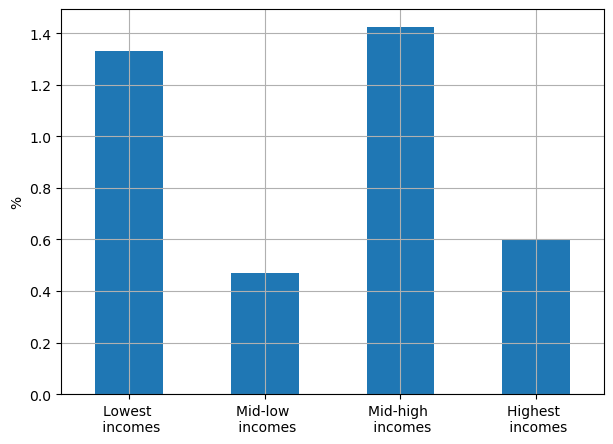

In [92]:
fig, ax = plt.subplots()
bar_width = 0.2
data_quantiles_base_insurance['frac_premium'].plot(figsize=(7, 5),kind='bar', stacked=False, ax=ax)
ax.set_ylabel('%')
ax.set_xlabel('')
# ax.set_title('Premium as a Percentage of Income')
ax.grid(True) 
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
if save_figures == True:
    plt.savefig(f'{folder}/quantiles, frac_premium.jpg', dpi=500, bbox_inches='tight')
plt.show()


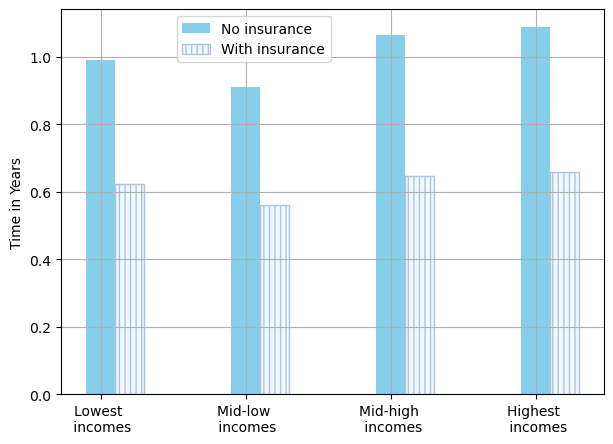

In [93]:
fig, ax = plt.subplots(figsize=(7, 5))
bar_width = 0.2
ax = data_quantiles_no_insurance['recovery_time'].plot(kind='bar', color='skyblue',stacked=False, position=0.5,ax=ax, width=bar_width)
data_quantiles_base_insurance['recovery_time'].plot(hatch='|||',edgecolor='lightsteelblue',kind="bar",color='aliceblue', ax=ax, stacked=False, position=-0.5, width=bar_width)

ax.set_ylabel('Time in Years')
ax.set_xlabel('')
# ax.set_title('Optimal Recovery Time in Years')
ax.grid(True) 
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
ax.legend(bbox_to_anchor=(0.2, 1), loc='upper left',labels=['No insurance', 'With insurance', 'uptake 65% insurance', 'uptake 80% insurance'])

plt.axis('tight')

if save_figures == True:
    plt.savefig(f'{folder}/quantiles, reovery_time, insurance.jpg', dpi=500, bbox_inches='tight')

plt.show()


#### results per income group → premium as a fraction of income (???)

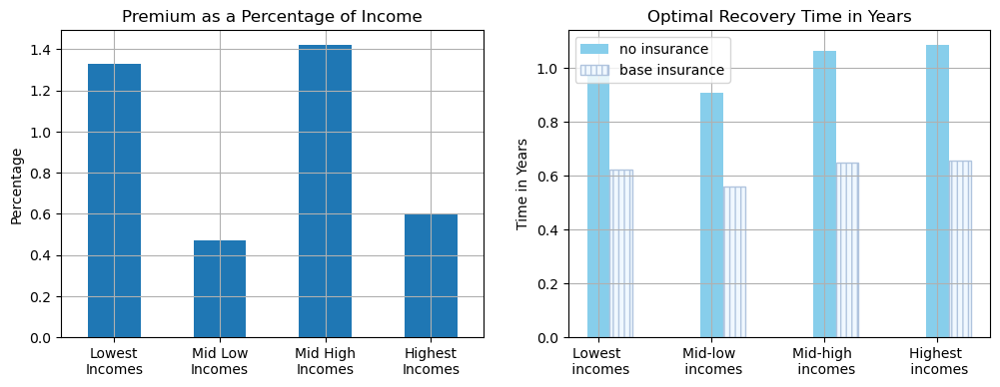

In [95]:
fig, axs = plt.subplots(1, 2, figsize=(12, 4))
bar_width = 0.2
ax = data_quantiles_base_insurance['frac_premium'].plot(kind='bar', stacked=False, ax=axs[0])
ax.set_ylabel('Percentage')
ax.set_xlabel('')
ax.set_title('Premium as a Percentage of Income')
ax.grid(True) 
ax.set_xticklabels(['Lowest\nIncomes', 'Mid Low\nIncomes', 'Mid High\nIncomes', 'Highest\nIncomes'], rotation=0)

ax = data_quantiles_no_insurance['recovery_time'].plot(kind='bar', color='skyblue',stacked=False, position=0.5,ax=axs[1], width=bar_width)
data_quantiles_base_insurance['recovery_time'].plot(hatch='|||',edgecolor='lightsteelblue',kind="bar",color='aliceblue', ax=axs[1], stacked=False, position=-0.5, width=bar_width)

ax.set_ylabel('Time in Years')
ax.set_xlabel('')
ax.set_title('Optimal Recovery Time in Years')
ax.grid(True) 
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
ax.legend(['no insurance', 'base insurance', 'uptake 65% insurance', 'uptake 80% insurance'])

plt.axis('tight')

if save_figures == True:
    plt.savefig(f'{folder}/quantiles, frac_premium and reovery_time.jpg', dpi=500, bbox_inches='tight')

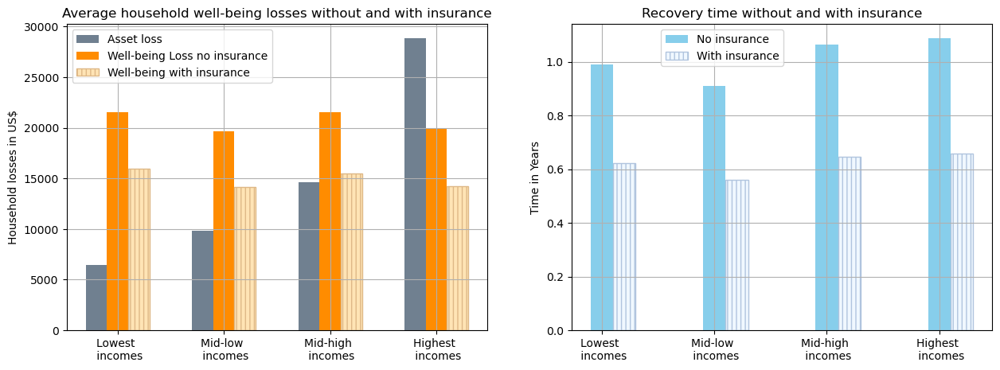

In [96]:
fig, axs = plt.subplots(1, 2, figsize=(15, 5))
colors = ['slategray', 'darkorange', 'moccasin', 'linen', 'yellowgreen', 'khaki']
# Plotting the first graph
ax = data_quantiles_no_insurance['damage'].plot(ax=axs[0], kind='bar', stacked=False, position=1.5, color=colors[0], width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(ax=ax, kind="bar", stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_base_insurance['welfare_loss'].plot(hatch='|||',edgecolor='burlywood',kind="bar", ax=ax, stacked=False, position=-0.5, color=colors[2], width=bar_width)
ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
ax.set_title(f'Average household well-being losses without and with insurance')
ax.grid(True)
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
ax.legend(['Asset loss', 'Well-being Loss no insurance', 'Well-being with insurance', 'Welfare Loss with insurance 65% take up', 'Welfare Loss with insurance 80% take up'])
ax.axis('tight')
# Plotting the second graph
ax = data_quantiles_no_insurance['recovery_time'].plot(ax=axs[1], kind='bar', color='skyblue', stacked=False, position=0.5, width=bar_width)
data_quantiles_base_insurance['recovery_time'].plot(ax=ax, hatch='|||', edgecolor='lightsteelblue', kind="bar", color='aliceblue', stacked=False, position=-0.5, width=bar_width)
ax.set_ylabel('Time in Years')
ax.set_xlabel('')
ax.set_title(f'Recovery time without and with insurance')
ax.grid(True) 
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)
ax.legend(bbox_to_anchor=(0.2, 1), loc='upper left',labels=['No insurance', 'With insurance', 'uptake 65% insurance', 'uptake 80% insurance'])

plt.axis('tight')

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, insurance, well-being and recovery time.jpg', dpi=500, bbox_inches='tight')

plt.show()


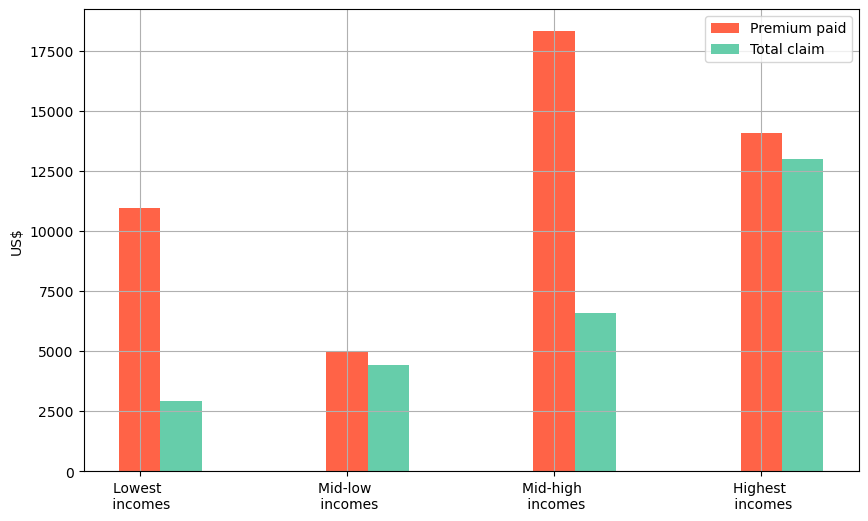

In [97]:
fig, axs = plt.subplots(1, 1, figsize=(10, 6))  # Modify figsize accordingly
bar_width = 0.2  # Adjust bar width if needed

ax = premium_df['total_premium_payed'].plot(kind='bar', color='tomato',position=0.5, ax=axs, width=bar_width)
premium_df['total_claim'].plot(kind='bar', color='mediumaquamarine',position=-0.5, ax=axs, width=bar_width)

ax.set_ylabel('US$')
ax.set_xlabel('')
# ax.set_title('Premium paid versus payout received')
ax.grid(True)
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)

ax.legend(['Premium paid', 'Total claim'])

plt.axis('tight')

if save_figures == True:
    plt.savefig(f'{folder}/quantiles, premium paid versus total claim.jpg', dpi=500, bbox_inches='tight')

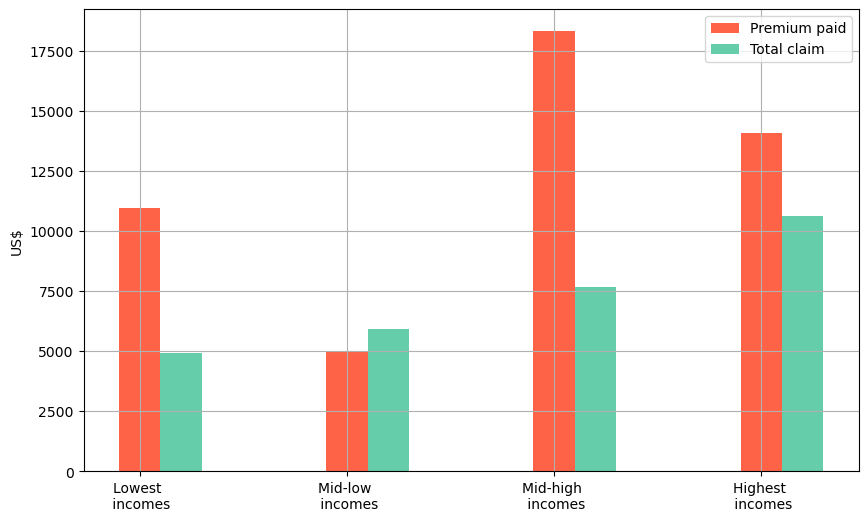

In [98]:
fig, axs = plt.subplots(1, 1, figsize=(10, 6))  # Modify figsize accordingly
bar_width = 0.2  # Adjust bar width if needed

ax = premium_df_control['total_premium_payed'].plot(kind='bar', color='tomato',position=0.5, ax=axs, width=bar_width)
premium_df_control['total_claim'].plot(kind='bar', color='mediumaquamarine',position=-0.5, ax=axs, width=bar_width)

ax.set_ylabel('US$')
ax.set_xlabel('')
# ax.set_title('Premium paid versus payout received')
ax.grid(True)
ax.set_xticklabels(['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes'], rotation=0)

ax.legend(['Premium paid', 'Total claim'])

plt.axis('tight')

if save_figures == True:
    plt.savefig(f'{folder}/quantiles, control, premium paid versus total claim.jpg', dpi=500, bbox_inches='tight')

#### results per income group → damage & welfare loss with insurance & welfare loss without insurance & third scenario (???)

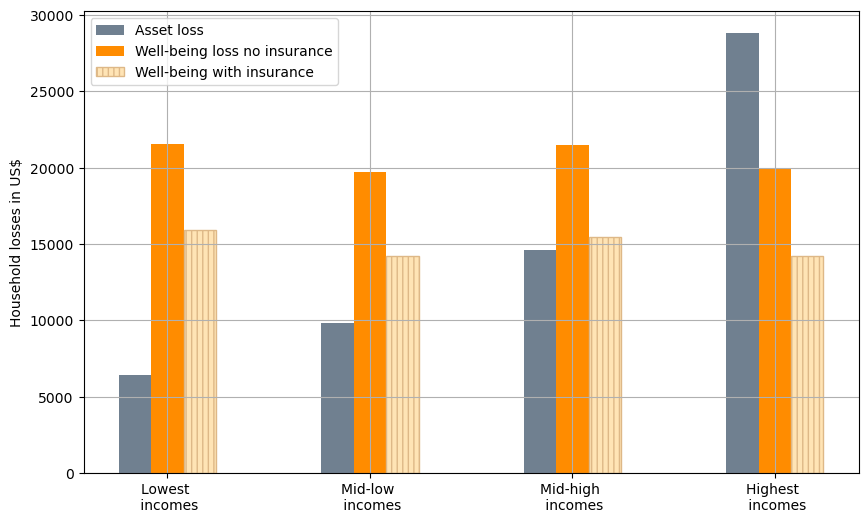

In [100]:
bar_width=0.16

colors = ['slategray', 'darkorange', 'moccasin', 'linen', 'yellowgreen', 'khaki']
custom_cmap = ListedColormap(colors)

ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=1.5, color=colors[0],width=bar_width)
data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=0.5, color=colors[1], width=bar_width)
data_quantiles_base_insurance['welfare_loss'].plot(hatch='|||',edgecolor='burlywood',kind="bar", ax=ax, stacked=False, position=-0.5, color=colors[2], width=bar_width)
# data_quantiles_uptake65_insurance['welfare_loss'].plot(hatch='|||',edgecolor='bisque',kind="bar", ax=ax, stacked=False, position=-1.5, color=colors[3], width=bar_width)
# data_quantiles_uptake80_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=-2.5, color='beige', width=bar_width)

#INCLUDE INCOME LOSS
# ax = data_quantiles_no_insurance['damage'].plot(figsize=[10,6],kind='bar', stacked=False, position=2.7, color=colors[0],width=bar_width)
# data_quantiles_no_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=1.5, color=colors[1], width=bar_width)
# data_quantiles_base_insurance['welfare_loss'].plot(hatch='|||',edgecolor='burlywood',kind='bar',ax=ax, stacked=False, position=0.5, color=colors[2],width=bar_width)
# # data_quantiles_uptake65_insurance['welfare_loss'].plot(kind="bar", ax=ax, stacked=False, position=-1.5, color=colors[3], width=bar_width)

# data_quantiles_no_insurance['income_loss'].plot(kind="bar", ax=ax, stacked=False, position=-0.7, color=colors[4], width=bar_width)
# data_quantiles_base_insurance['income_loss'].plot(hatch='|||',edgecolor='darkkhaki',kind="bar", ax=ax, stacked=False, position=-1.7, color=colors[5], width=bar_width)

ax.set_ylabel('Household losses in US$')
ax.set_xlabel('')
# ax.set_title(f'Damage and Welfare Loss Quantiles')
ax.grid(True)
plt.axis('tight')  # Adjust layout to reduce whitespace
# ax.set_ylim(0, 27000)

categories = ['Lowest \n incomes', 'Mid-low \n incomes', 'Mid-high \n incomes', 'Highest \n incomes']
plt.xticks(range(len(categories)), categories, rotation=0)

# Display the legend
ax.legend(['Asset loss', 'Well-being loss no insurance', 'Well-being with insurance', 'Welfare Loss with insurance 65% take up', 'Welfare Loss with insurance 80% take up'])

if save_figures == True:
    plt.savefig(f'{folder}/Quantiles, well-being loss, insurance scenarios.jpg',dpi=500, bbox_inches='tight')

In [101]:
# load in dataset

In [102]:
total_asset = 3500+3500+4500+6000
total_asset

17500

In [103]:
total_wellb = 32000+18000+16000+12000
total_wellb

78000

In [104]:
print('percentage of asset loss of low income', 3500/total_asset*100)
print('percentage of welfare loss of low income', 32000/total_wellb*100)

percentage of asset loss of low income 20.0
percentage of welfare loss of low income 41.02564102564102


In [105]:
print('percentage of asset loss of high income', 6000/total_asset*100)
print('percentage of welfare loss of high income', 12000/total_wellb*100)

percentage of asset loss of high income 34.285714285714285
percentage of welfare loss of high income 15.384615384615385


In [106]:
print('low incomes lose',32000/3500,'more well-being than assets')
print('high incomes lose',12000/6000,'more well-being than assets')

low incomes lose 9.142857142857142 more well-being than assets
high incomes lose 2.0 more well-being than assets


In [107]:
total_asset_phil = 200+250+300+450+1000
total_wellb_phil = 3000+1900+1300+1000+500

In [108]:
print('percentage of asset loss of low income', 200/total_asset_phil*100)
print('percentage of welfare loss of low income', 3000/total_wellb_phil*100)

percentage of asset loss of low income 9.090909090909092
percentage of welfare loss of low income 38.961038961038966


In [109]:
print('percentage of asset loss of high income', 1000/total_asset_phil*100)
print('percentage of welfare loss of high income', 500/total_wellb_phil*100)

percentage of asset loss of high income 45.45454545454545
percentage of welfare loss of high income 6.493506493506493


In [110]:
print('low incomes lose',3000/200,'more well-being than assets')
print('high incomes lose',500/1000,'more well-being than assets')

low incomes lose 15.0 more well-being than assets
high incomes lose 0.5 more well-being than assets
